# Running Model

Calibrated params from calibration_us_gdp.ipynb

/Users/ebbamark/Documents/Documents - Nuff-Malham/GitHub/transition_abm/calibration_remote/collate_macro_vars.py:213: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset['OBS_VALUE'] = hp_filter.hpfilter(subset['OBS_VALUE'], lamb=1600)[0]*.01+1


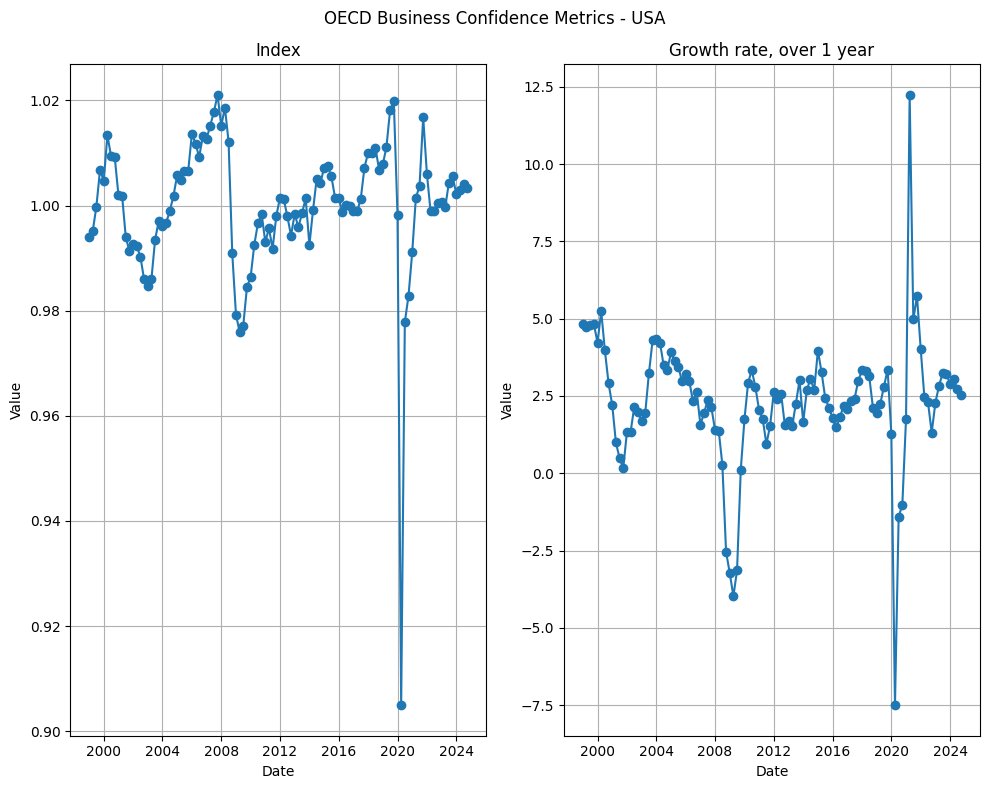

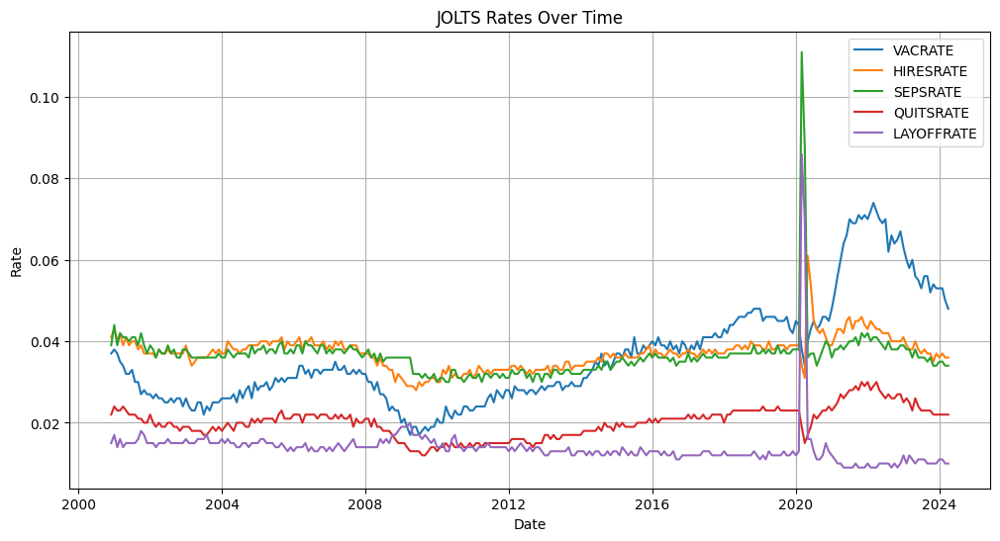

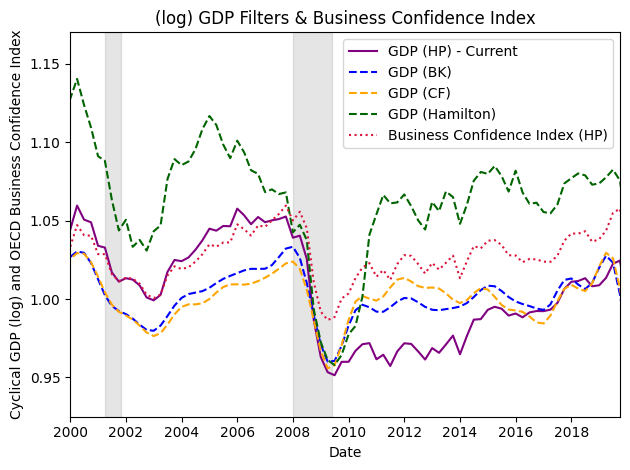

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/seaborn/_ol

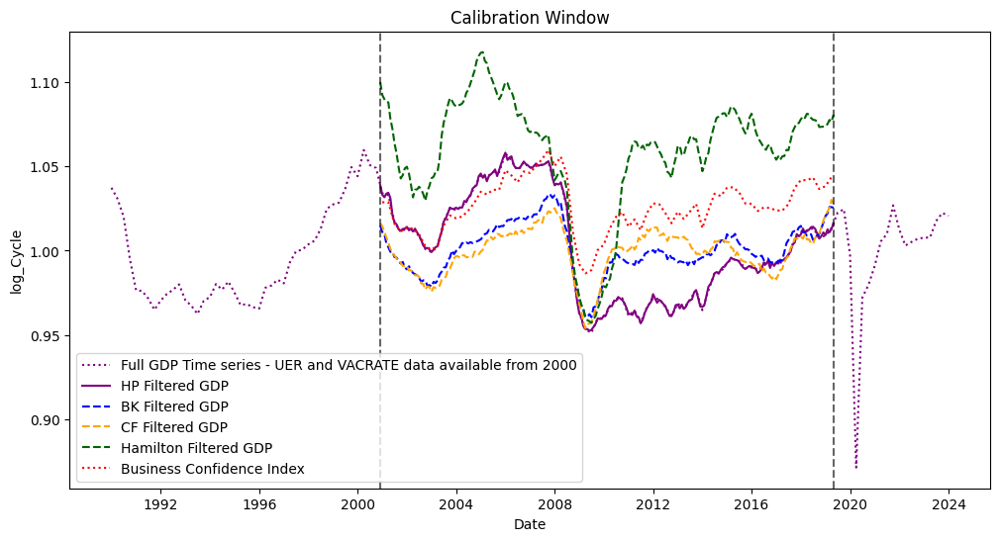

NEW Function import successful
8


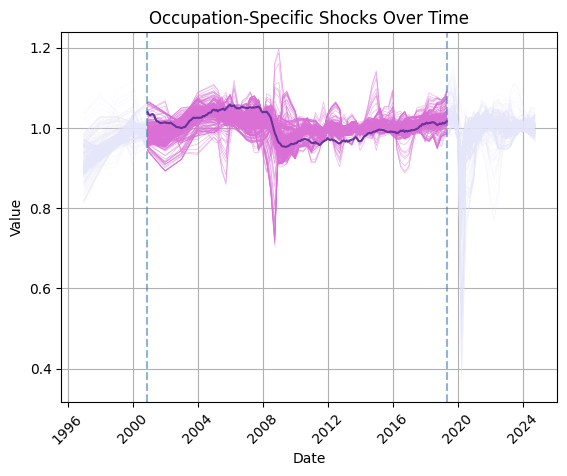

In [1]:
# Import packages
from abm_funs import *
from plot_funs import*
# from us_input import *
import numpy as np
from copy import deepcopy 
import pandas as pd
import random as random
import matplotlib.pyplot as plt
from scipy.stats import truncnorm
from model_fun import *
from scipy.stats import pearsonr, linregress
import math as math
import importlib
from copy import deepcopy
from pandas import Series
import os
import seaborn as sns
import matplotlib.gridspec as gridspec
import datetime

from collate_macro_vars import *
from statsmodels.tsa.filters import hp_filter, bk_filter, cf_filter
from quantecon import hamilton_filter
from statsmodels.tsa.seasonal import seasonal_decompose
import csv

rng = np.random.default_rng()
test_fun()

path = "~/Documents/Documents - Nuff-Malham/GitHub/transition_abm/calibration_remote/"

import os
print(os.cpu_count()) 

save_button = True
which_params = "occ_seps_rates/"

In [2]:
print(np.min(occ_shocks_dat))

0.708132334746154


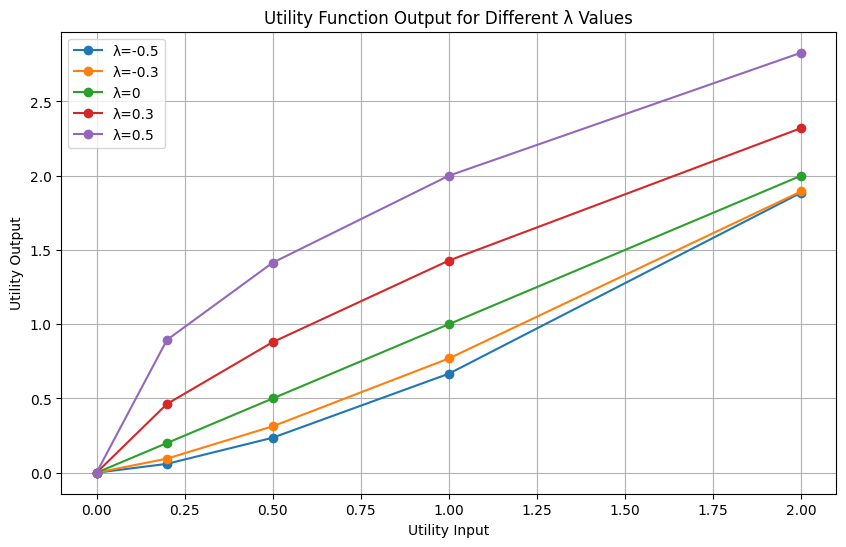

In [3]:
def utility_fun(lambda_param, utility):
   if lambda_param == 1:
        return(np.log(utility))
   else:
        return((utility**(1-lambda_param))/(1-lambda_param))
   
lambdas = [-0.5, -0.3, 0, 0.3, 0.5]
utilities = [0, 0.2, 0.5, 1, 2]

plt.figure(figsize=(10, 6))

for lambda_p in lambdas:
    utility_outputs = []
    for utility in utilities:
        utility_outputs.append(utility_fun(lambda_p, utility))
    plt.plot(utilities, utility_outputs, marker='o', label=f'λ={lambda_p}')

plt.xlabel('Utility Input')
plt.ylabel('Utility Output') 
plt.title('Utility Function Output for Different λ Values')
plt.grid(True)
plt.legend()
plt.show()


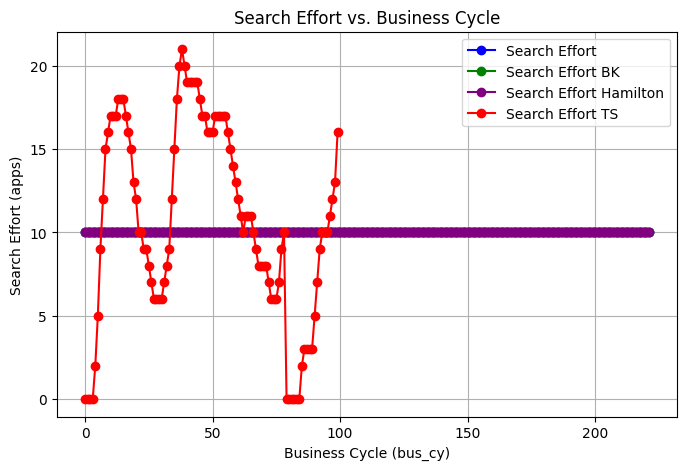

In [4]:
# Search Effort Time Series
search_effort_dat = pd.read_csv("data/quarterly_search_ts.csv")
search_effort_dat['DATE'] = pd.to_datetime(search_effort_dat['year'].astype(str) + '-' + (search_effort_dat['quarter'] * 3 - 2).astype(str) + '-01')
search_effort_np = np.array(search_effort_dat['value_smooth'])
search_effort_np = search_effort_np/search_effort_np.mean()
#realgdp[(realgdp['DATE'] >= calib_date[0]) & (realgdp['DATE'] <= calib_date[1])]

# Define a range of bus_cy values  # Generates 100 values from 0 to 1
search_effort_values = [search_effort_alpha(0, b, False, 0.1) for b in gdp_dat]  # Apply function
search_effort_bk_values = [search_effort_alpha(0, b, False, 0.1) for b in gdp_dat_bk]  # Apply function
search_effort_hamilton_values = [search_effort_alpha(0, b, False, 0.1) for b in gdp_dat_hamilton]  # Apply function
# def search_effort_ts(t_unemp, se):
#     apps = max(0, round(10 - 100*(1-se)))
#     # if discouraged:
#     #     apps = round(a_stable/((t_unemp)**2 + 1)) + 1
#     return apps
search_effort_values_dyn = [search_effort_ts(0, b) for b in search_effort_np]

# Plot the results
plt.figure(figsize=(8, 5))
plt.plot(range(len(search_effort_values)), search_effort_values, marker='o', linestyle='-', color='b', label="Search Effort")
plt.plot(range(len(search_effort_bk_values)), search_effort_bk_values, marker='o', linestyle='-', color='g', label="Search Effort BK")
plt.plot(range(len(search_effort_hamilton_values)), search_effort_hamilton_values, marker='o', linestyle='-', color='purple', label="Search Effort Hamilton")

plt.plot(range(len(search_effort_values_dyn)), search_effort_values_dyn, marker='o', linestyle='-', color='r', label="Search Effort TS")
plt.xlabel("Business Cycle (bus_cy)")
plt.ylabel("Search Effort (apps)")
plt.title("Search Effort vs. Business Cycle")
plt.legend()
plt.grid(True)
plt.show()

We draw the probability distribution of sending a particular binned value of applications from our work on the BLS Suppelement. We assume a uniform distribution within each bin setting a maximum application effort in the highest bin to 100 applications. 

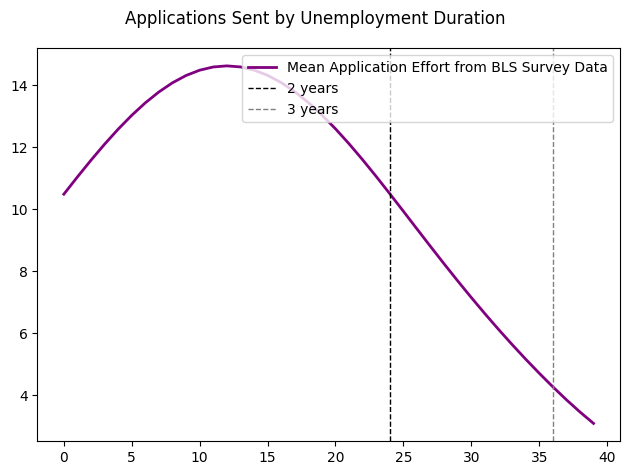

In [5]:
# series_dict = {}
# for i, a in enumerate([0.1, 0.05, 0.01]):
#     efforts = []
#     for t_unemp in range(36):
#         apps = search_effort_alpha(t_unemp, 1, True, a)
#         efforts.append(apps)

#     series_dict[f"Alpha: {a}"] = {
#         "x": list(range(0, len(efforts))),
#         "y": efforts
#         }

imposed_efforts = []
for t_unemp in range(40):
    apps = applications_sent(duration_months=t_unemp, duration_to_prob_dict=duration_to_prob_dict, expectation = True)
    imposed_efforts.append(apps)

bls_df = {
    "x": list(range(0, len(imposed_efforts))),
    "y": imposed_efforts
    }
   
plt.plot(bls_df['x'], bls_df['y'], color='purple', linestyle='-', linewidth=2, label='Mean Application Effort from BLS Survey Data')

plt.axvline(x=24, color='black', linestyle='--', linewidth=1, label='2 years')
plt.axvline(x=36, color='grey', linestyle='--', linewidth=1, label='3 years')
plt.legend(loc='upper right')
plt.suptitle("Applications Sent by Unemployment Duration")
plt.tight_layout()
plt.savefig('output/figures/applications_sent_by_unemployment_duration.png', dpi=300)
plt.show()


### Unemployed Search Effort Time Series

In [6]:
# Macro observations
observation = macro_observations.loc[
    (macro_observations['DATE'] >= calib_date[0]) & 
    (macro_observations['DATE'] <= calib_date[1])].dropna(subset=["UNRATE", "VACRATE"]).reset_index()


# Load US_input data
A = pd.read_csv(path + "dRC_Replication/data/occupational_mobility_network.csv", header=None)
employment = round(pd.read_csv(path + "dRC_Replication/data/ipums_employment_2016.csv", header=0).iloc[:, [4]] / 10000)

# Crude approximation using avg unemployment rate of ~5% - should aim for occupation-specific unemployment rates
unemployment = round(employment * (0.05 / 0.95))

# Less crude approximation using avg vacancy rate - should still aim for occupation-specific vacancy rates
vac_rate_base = pd.read_csv(path + "dRC_Replication/data/vacancy_rateDec2000.csv").iloc[:, 2].mean() / 100
vacancies = round(employment * vac_rate_base / (1 - vac_rate_base))

# Needs input data...
demand_target = employment + vacancies
wages = pd.read_csv(path + "dRC_Replication/data/ipums_variables.csv")[['median_earnings']]
occ_ids = pd.read_csv(path + "dRC_Replication/data/ipums_variables.csv")[['id', 'acs_occ_code']]
gend_share = pd.read_csv(path + "data/ipums_variables_w_gender.csv")[['women_pct']]
experience_req = pd.read_csv(path + "dRC_Replication/data/ipums_variables_w_exp.csv")
seps_rates = pd.read_csv(path + "dRC_Replication/data/ipums_variables_w_seps_rate.csv")

mod_data = {
    "A": A,
    "employment": employment,
    'unemployment': unemployment,
    'vacancies': vacancies,
    'demand_target': demand_target,
    'wages': wages,
    'gend_share': gend_share,
    'entry_level': experience_req['entry_level'],
    # 'entry_age': experience_req['entry_age'],
    'experience_age': experience_req['experience_age'],
    'separation_rates': seps_rates['seps_rate']*10
}

# Create complete network
n = A.shape
complete_network = np.ones(n)
mod_data_complete = {
    "A": complete_network,
    "employment": employment,
    'unemployment': unemployment,
    'vacancies': vacancies,
    'demand_target': demand_target,
    'wages': wages,
    'gend_share': gend_share,
    'entry_level': experience_req['entry_level'],
    # 'entry_age': experience_req['entry_age'],
    'experience_age': experience_req['experience_age'],
    'separation_rates': seps_rates['seps_rate']*10

}

###################################
# Initialise the model
##################################
net_temp, vacs = initialise(
    len(mod_data['A']),
    mod_data['employment'].to_numpy(),
    mod_data['unemployment'].to_numpy(),
    mod_data['vacancies'].to_numpy(),
    mod_data['demand_target'].to_numpy(),
    mod_data['A'],
    mod_data['wages'].to_numpy(),
    mod_data['gend_share'].to_numpy(),
    7, 3,
    mod_data['entry_level'],
    mod_data['experience_age'],
    mod_data['separation_rates']
)
net_temp_complete, vacs_complete = initialise(
    len(mod_data_complete['A']),
    mod_data_complete['employment'].to_numpy(),
    mod_data_complete['unemployment'].to_numpy(),
    mod_data_complete['vacancies'].to_numpy(),
    mod_data_complete['demand_target'].to_numpy(),
    mod_data_complete['A'],
    mod_data_complete['wages'].to_numpy(),
    mod_data_complete['gend_share'].to_numpy(),
    7, 3,
    mod_data_complete['entry_level'],
    mod_data_complete['experience_age'],
    mod_data_complete['separation_rates']
)

# Load calibrated parameters from CSV
param_df = pd.read_csv(path + "output/calibrated_params_all.csv")
# Sort by Timestamp in descending order
param_df = param_df.sort_values(by='Timestamp', ascending=False)

params = {
    'mod_data': mod_data,
    'net_temp': net_temp,
    'vacs': vacs,
    'time_steps': len(gdp_dat),
    'delay': 0,
    'gdp_data': gdp_dat,
    'app_effort_dat': duration_to_prob_dict,
    'occ_shocks_data': occ_shocks_dat
}

# Shorten vac_df to the same length as gdp_dat using a moving average (if needed)
vac_df = observation['VACRATE'].to_numpy()
if len(vac_df) > len(gdp_dat):
    print("smoothing vac_df")
    # Apply moving average with window to smooth and match length
    window = len(vac_df) // len(gdp_dat)
    vac_dat = Series(vac_df).rolling(window=window, min_periods=1).mean()[window-1::window].reset_index(drop=True)
    vac_dat = vac_dat[:len(gdp_dat)]
else:
    vac_dat = vac_df[:len(gdp_dat)]




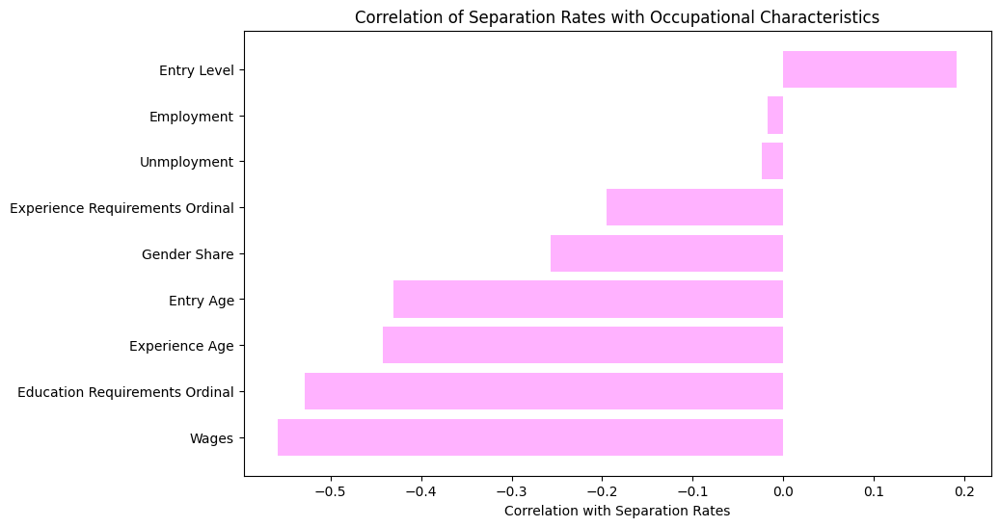

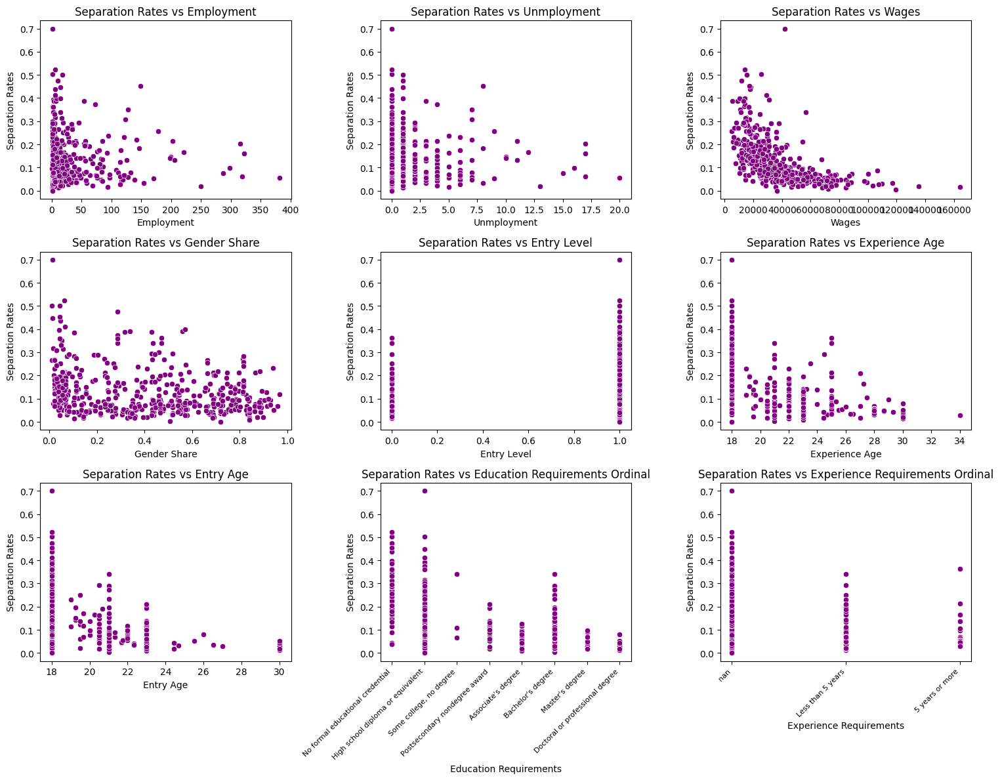

In [7]:
# Prepare DataFrame for correlation analysis
mod_data_df = pd.DataFrame({
    'Employment':employment['IPUMS_CPS_av_monthly_employment_whole_period'],
    'Unmployment':unemployment['IPUMS_CPS_av_monthly_employment_whole_period'],
    #'Target Demand':demand_target['IPUMS_CPS_av_monthly_employment_whole_period'],
    'Wages': mod_data['wages']['median_earnings'],
    'Gender Share': mod_data['gend_share']['women_pct'],
    'Entry Level': mod_data['entry_level'],
    'Experience Age': mod_data['experience_age'],
    'Separation Rates': mod_data['separation_rates'],
    'Education Requirements': experience_req['ed_req'],
    'Experience Requirements': experience_req['experience_req'],
    'Entry Age': experience_req['entry_age'],
    'Experience Age': experience_req['experience_age']
})

# Map education requirements to ordinal values
edu_order = [
    'No formal educational credential',
    'High school diploma or equivalent',
    'Some college, no degree',
    'Postsecondary nondegree award',
    "Associate's degree",
    "Bachelor's degree",
    "Master's degree",
    'Doctoral or professional degree'
]

experience_order = [
    np.nan,
    "Less than 5 years",
    "5 years or more"
]
edu_map = {name: i for i, name in enumerate(edu_order)}
mod_data_df['Education Requirements Ordinal'] = mod_data_df['Education Requirements'].map(edu_map)

experience_map = {name: i for i, name in enumerate(experience_order)}
mod_data_df['Experience Requirements Ordinal'] = mod_data_df['Experience Requirements'].map(experience_map)
# Calculate correlations between Separation Rates and other variables
corrs = mod_data_df.drop(columns=['Education Requirements', 'Experience Requirements']).corr()
sep_corrs = corrs['Separation Rates'].drop('Separation Rates')

# Sort correlations by absolute value (or just value)
sep_corrs_sorted = sep_corrs.sort_values()

# Plot correlation coefficients as a bar plot
plt.figure(figsize=(10, 6))
bars = plt.barh(sep_corrs_sorted.index, sep_corrs_sorted.values, color='magenta', alpha=0.3)
plt.xlabel('Correlation with Separation Rates')
plt.title('Correlation of Separation Rates with Occupational Characteristics')


# Scatterplots of separation_rates vs each other variable in a 3x3 grid
# Exclude specific columns from scatterplots
exclude_cols = ['Education Requirements', 'Experience Requirements', 'Separation Rates']
other_cols = [col for col in mod_data_df.columns if col not in exclude_cols]
fig, axes = plt.subplots(3, 3, figsize=(15, 12))
axes = axes.flatten()

for i, col in enumerate(other_cols):
    ax = axes[i]
    sns.scatterplot(x=mod_data_df[col], y=mod_data_df['Separation Rates'], color="purple", ax=ax)
    ax.set_ylabel('Separation Rates')
    ax.set_title(f'Separation Rates vs {col}')
    # Custom x-tick labels for ordinal columns
    if col == 'Education Requirements Ordinal':
        ax.set_xticks(range(len(edu_order)))
        ax.set_xticklabels(edu_order, rotation=45, ha='right', fontsize=8)
        ax.set_xlabel('Education Requirements')
    elif col == 'Experience Requirements Ordinal':
        ax.set_xticks(range(len(experience_order)))
        ax.set_xticklabels([str(x) if pd.isna(x) else x for x in experience_order], rotation=45, ha='right', fontsize=8)
        ax.set_xlabel('Experience Requirements')
    else:
        ax.set_xlabel(col)

# Hide any unused subplots
for j in range(len(other_cols), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()



In [8]:
calib_list = {
    "nonbehav": {"otj": False, # has been run
                           "cyc_otj": False, 
                           "cyc_ue": False, 
                           "disc": False,
                           "delay": 25,
                           "bus_confidence_dat": gdp_dat,
                           'vac_data': vac_dat},
              "otj_nonbehav": {"otj": True, # has been run
                           "cyc_otj": False, 
                           "cyc_ue": False, 
                           "disc": False, 
                           "delay": 25,
                           "bus_confidence_dat": gdp_dat,
                            "vac_data": vac_dat},
            #   "otj_cyclical_e": {"otj": True,
            #                "cyc_otj": True, 
            #                "cyc_ue": False, 
            #                "disc": False,
            #                "bus_confidence_dat": gdp_dat},
            #   "otj_cyclical_ue": {"otj": True,
            #                "cyc_otj": False, 
            #                "cyc_ue": True, 
            #                "disc": False,
            #                "bus_confidence_dat": gdp_dat},
            #   "otj_cyclical_e_ue": {"otj": True,
            #                "cyc_otj": True, 
            #                "cyc_ue": True, 
            #                "disc": False,
            #                "bus_confidence_dat": gdp_dat},
              "otj_cyclical_e_disc": {"otj": True,
                           "cyc_otj": True, 
                           "cyc_ue": False, 
                           "disc": True,
                           "delay": 25,
                           "bus_confidence_dat": gdp_dat,
                           "vac_data": vac_dat},
            #   "otj_cyclical_ue_disc": {"otj": True,
            #                "cyc_otj": False, 
            #                "cyc_ue": True, 
            #                "disc": True,
            #                "bus_confidence_dat": gdp_dat},
              # "otj_cyclical_e_ue_disc": {"otj": True,
              #              "cyc_otj": True, 
              #              "cyc_ue": True, 
              #              "disc": True,
              #              "bus_confidence_dat": gdp_dat},
            "otj_disc": {"otj": True,
                          "cyc_otj": False, 
                          "cyc_ue": False, 
                          "disc": True,
                          "delay": 25,
                          "bus_confidence_dat": gdp_dat,
                          "vac_data": vac_dat}
            }


In [9]:
# Initialize the results dictionaries
model_results = {}
net_results = {}
sim_results = {}
sum_stats_list = {}
seekers_recs_list = {}
avg_wage_off_diffs = {}
app_loads = {}
time_to_emps = {}

print(param_df)
# Loop through each model configuration
for name, item in calib_list.items():
    # Create a deep copy of the base parameters
    print(name)
    test_params = deepcopy(params)

    # Update with values from param_df specific to the current model name
    # if name in param_df['model_cat'].values:
    #     param_updates = param_df[param_df['model_cat'] == name].set_index('Parameter')['Value'].to_dict()
    #     print(param_updates)
    #     test_params.update(param_updates)
    if name in ['otj_nonbehav', 'nonbehav']:

        param_df_new = pd.read_csv(f'{path}output/{which_params}grid_search_results_{name}.csv')
    else:
        grid_results = pd.read_csv(f'{path}output/grid_search_results_{name}.csv')
        param_df_new = grid_results[grid_results['timestamp'] > '2025-09-05']
    # Sort by Timestamp in descending order
    param_df_new = param_df_new.sort_values(by='distance', ascending=True).reset_index(drop=True)
    calib_params = {
        'd_u': 0.02, #param_df_new['d_u'][0]-0.15,
        'gamma_u': 0 # param_df_new['gamma_u'][0]
    }
    print(calib_params)
    test_params.update(calib_params)

    # Update with the values from the calib_list
    test_params.update(item)
    test_params.update({"steady_state": True,
                        "time_steps": 300,
                        "delay": 0})
    
    # Run the model
    sim_record, sim_grouped, sim_net, sum_stats, seekers_rec, avg_wage_off_diff, app_loads_df, time_to_emp = run_single_local(**test_params)

    # Generate plots or metrics (optional step)
    #ue_vac = plot_records(sim_record, calib_date[0], calib_date[1])
    sim_grouped['DATE'] = pd.date_range(start=calib_date[0], end= calib_date[1], periods=len(sim_grouped))
    sim_grouped['LTUER'] = sim_grouped['LT Unemployed Persons'] / sim_grouped['Unemployment']
    sim_grouped['AVGWAGE'] = sim_grouped['Total_Wages'] / sim_grouped['Employment']
    sim_grouped["Seeker Composition"] = sim_grouped["Employed Seekers"] / (sim_grouped["Employed Seekers"] + sim_grouped["Unemployed Seekers"])
    sim_record['LTUER'] = sim_record['LT Unemployed Persons'] / sim_record['Unemployment']
    sim_record['UER'] = sim_record['Unemployment'] / sim_record['Workers']
    sim_record['AVGWAGE'] = sim_record['Total_Wages'] / sim_record['Employment']
    sim_record['VACRATE1'] = sim_record['Vacancies'] / sim_record['Target_Demand']
    sim_record['VACRATE'] = sim_record['Vacancies'] / (sim_record['Vacancies'] + sim_record['Employment'])
    sim_record['U_REL_WAGE_MEAN'] = sim_record['U_Rel_Wage'] / sim_record['UE_Transitions']
    sim_record['E_REL_WAGE_MEAN'] = sim_record['E_Rel_Wage'] / sim_record['EE_Transitions']
    sim_record['UE_Trans_Rate'] = sim_record['UE_Transitions'] / sim_record['Workers']
    sim_record['EE_Trans_Rate'] = sim_record['EE_Transitions'] / sim_record['Workers']
    sim_record = sim_record.merge(occ_ids, left_on='Occupation', right_on="id", how='left')

    seekers_rec['DATE'] = pd.date_range(start=calib_date[0], end= calib_date[1], periods=len(seekers_rec))
    seekers_rec['Application Effort (U)'] = seekers_rec['Applications Sent (Unemployed)'] / seekers_rec['Unemployed Seekers']
    seekers_rec['Application Effort (E)'] = seekers_rec['Applications Sent (Employed)'] / seekers_rec['Employed Seekers']


    # Store the results
    model_results[name] = sim_grouped
    sim_results[name] = sim_record
    net_results[name] = sim_net
    sum_stats_list[name] = sum_stats
    seekers_recs_list[name] = seekers_rec
    avg_wage_off_diffs[name] = avg_wage_off_diff
    app_loads[name] = app_loads_df
    time_to_emps[name] = time_to_emp

   Parameter     Value    otj  cyc_otj  cyc_ue   disc            Timestamp  \
10       d_u  0.001965   True    False   False   True  2025-06-26 02:39:00   
11   gamma_u  0.005895   True    False   False   True  2025-06-26 02:39:00   
8        d_u  0.002340   True     True   False   True  2025-06-26 01:50:24   
9    gamma_u  0.005114   True     True   False   True  2025-06-26 01:50:24   
6        d_u  0.000352   True    False   False  False  2025-06-26 00:59:51   
7    gamma_u  0.617953   True    False   False  False  2025-06-26 00:59:51   
4        d_u  0.007198  False    False   False  False  2025-06-26 00:04:50   
5    gamma_u  0.647185  False    False   False  False  2025-06-26 00:04:50   
2        d_u  0.006155   True    False   False   True  2025-06-25 17:37:29   
3    gamma_u  0.020735   True    False   False   True  2025-06-25 17:37:29   
0        d_u  0.007504   True     True   False   True  2025-06-25 17:17:15   
1    gamma_u  0.018580   True     True   False   True  2025-06-2

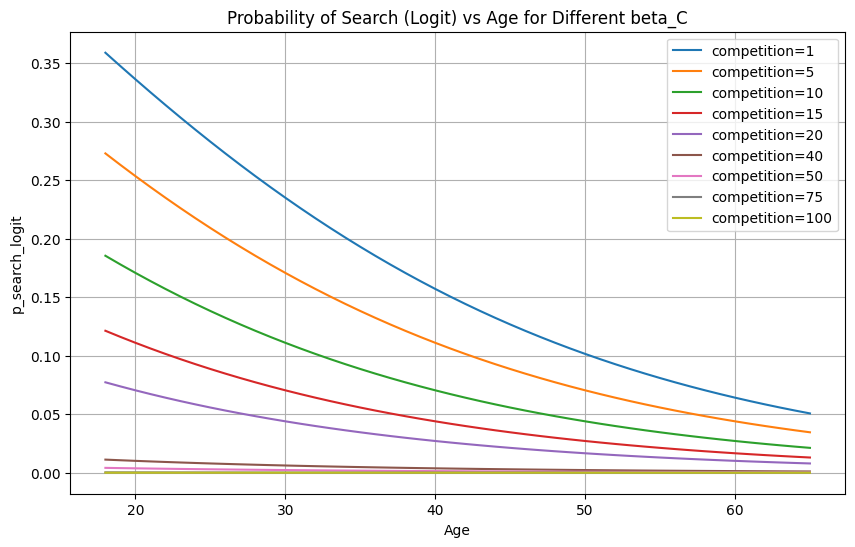

In [10]:

ages = np.arange(18, 66)
comp_values = [1,5,10,15,20,40,50,75,100]  # fixed competition value - 20 applications per vacancy

plt.figure(figsize=(10, 6))
for C in comp_values:
    p_vals = [ p_search_logit(
                            age,
                            # Taken from calculated competition metric for occupation
                            comp=C,
                            alpha=-1.58,     # tune baseline
                            beta_A=-0.05,  # age effect
                            beta_C=-0.1,    # competition effect
                            A0=40.0
                        ) for age in ages]
    plt.plot(ages, p_vals, label=f'competition={C}')

plt.xlabel('Age')
plt.ylabel('p_search_logit')
plt.title('Probability of Search (Logit) vs Age for Different beta_C')
plt.legend()
plt.grid(True)
plt.show()

In [11]:
output_path = f'output/figures/'

# --- Apply plot labels to models ---
name_map = {
    "nonbehav": "Non-behavioural",
    "otj_nonbehav": "Non-behavioural w. OTJ",
    "otj_cyclical_e_disc": "Behavioural w. Cyc. OTJ",
    "otj_disc": "Behavioural w.o. Cyc. OTJ",
}
desired_order = list(name_map.keys())

def filter_and_relabel(d, mapping, order):
    return {mapping[k]: d[k] for k in order if k in d}

filtered_model_results = filter_and_relabel(model_results, name_map, desired_order)
filtered_net_results   = filter_and_relabel(net_results,   name_map, desired_order)
filtered_sim_results   = filter_and_relabel(sim_results,   name_map, desired_order)
filtered_sum_stats     = filter_and_relabel(sum_stats_list, name_map, desired_order)
seekers_recs    = filter_and_relabel(seekers_recs_list, name_map, desired_order)
filtered_app_loads    = filter_and_relabel(app_loads, name_map, desired_order)
filtered_time_to_emps = filter_and_relabel(time_to_emps, name_map, desired_order)

# test_params.update({'simple_res':True})
# test_seps_rate = run_single_local(**test_params)


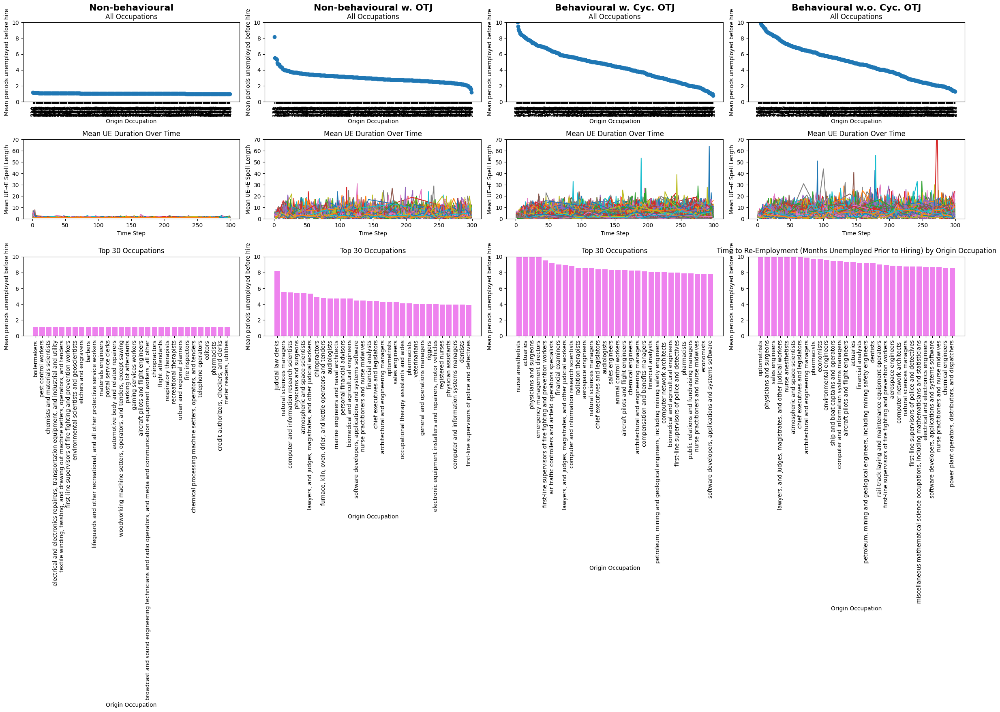

In [12]:
tmp = pd.read_csv(path + "dRC_Replication/data/ipums_variables.csv")
fig, axes = plt.subplots(3, 4, figsize=(24, 18))
model_names = filtered_time_to_emps.keys()
for col, i in enumerate(model_names):
    # 1. Bar plot (all occupations)
    mean_ue_by_origin = (
        filtered_time_to_emps[i]
        .groupby('OriginOccupation', as_index=True)['UEDuration']
        .mean()
        .sort_values(ascending=False)
    )
    x = np.arange(len(mean_ue_by_origin))
    axes[0, col].scatter(x, mean_ue_by_origin.values)
    axes[0, col].set_xticks(x)
    axes[0, col].set_xticklabels(mean_ue_by_origin.index.astype(str), rotation=90)
    axes[0, col].set_ylabel('Mean periods unemployed before hire')
    axes[0, col].set_xlabel('Origin Occupation')
    axes[0, col].set_title(f'All Occupations')
    axes[0,col].set_ylim(0,10)
    
    # 2. Bar plot (top 30 occupations)
    mean_ue_by_origin_short = mean_ue_by_origin.iloc[0:30]
    x_short = np.arange(len(mean_ue_by_origin_short))
    # Get labels from tmp for each occupation, fallback to Occ {id}
    labels_short = [tmp.loc[occ, 'label'] if occ in tmp.index else f'Occ {occ}' for occ in mean_ue_by_origin_short.index]
    axes[2, col].bar(x_short, mean_ue_by_origin_short.values, color="violet")
    axes[2, col].set_xticks(x_short)
    axes[2, col].set_xticklabels(labels_short, rotation=90)
    axes[2, col].set_ylabel('Mean periods unemployed before hire')
    axes[2, col].set_xlabel('Origin Occupation')
    axes[2, col].set_title(f'Top 30 Occupations')
    axes[2,col].set_ylim(0,10)

    
    # 3. Line plot (mean UE duration by origin occupation and time step)
    mean_ue_by_origin_time = (
        filtered_time_to_emps[i]
        .groupby(['OriginOccupation', 'Time Step'])['UEDuration']
        .mean()
        .reset_index()
    )
    # mean_ue_by_origin_time = mean_ue_by_origin_time.loc[
    #     mean_ue_by_origin_time['OriginOccupation'].isin(mean_ue_by_origin_short.index)
    # ]
    for occ in mean_ue_by_origin_time['OriginOccupation'].unique():
        group = mean_ue_by_origin_time[mean_ue_by_origin_time['OriginOccupation'] == occ]
        label = tmp.loc[occ, 'label'] if occ in tmp.index else f'Occ {occ}'
        axes[1, col].plot(group['Time Step'], group['UEDuration'], label=label)
    axes[1, col].set_xlabel('Time Step')
    axes[1, col].set_ylabel('Mean UE→E Spell Length')
    axes[1, col].set_title(f'Mean UE Duration Over Time')
    axes[1,col].set_ylim(0,70)

    #if col == 0:
    #    axes[2, col].legend(ncol=1, fontsize='small', bbox_to_anchor=(1.05, 1), loc='upper left')
    # Column label
    axes[0, col].annotate(i, xy=(0.5, 1.15), xycoords='axes fraction', ha='center', fontsize=16, fontweight='bold')

plt.title("Time to Re-Employment (Months Unemployed Prior to Hiring) by Origin Occupation")
plt.tight_layout()
plt.show()


In [13]:
# fig, axes = plt.subplots(2, 4, figsize=(24, 18))
# model_names = list(name_map.values())
# for col, i in enumerate(model_names):
#     mean_ue_by_origin = (
#         filtered_time_to_emps[i]
#         .groupby('OriginOccupation', as_index=True)['UEDuration']
#         .mean()
#         .sort_values(ascending=False)
#     )

#     temp_origin = mean_ue_by_origin[(mean_ue_by_origin > 5) | mean_ue_by_origin.index.isin(trending_occs)]

#     x = np.arange(len(temp_origin))
#     labels = []
#     for occ in temp_origin.index:
#         label = tmp['label'].loc[occ] if occ in tmp.index else f'Occ {occ}'
#         labels.append(label)

#     plt.figure(figsize=(12, 6))

#     for k in range(len(temp_origin)):
#         if temp_origin.index[k] in trending_occs:
#             color = "red"
#         else:
#             color = "blue"
#         axes[0, col].bar(k, temp_origin.iloc[k], color=color)

#     plt.xticks(np.arange(len(temp_origin)), labels, rotation=90)
#     axes[0, col].bar(x, temp_origin.values)
#     axes[0, col].set_xticks(x)
#     axes[0, col].set_xticklabels(temp_origin.index.astype(str), rotation=90)
#     axes[0, col].set_ylabel('Mean periods unemployed before hire')
#     axes[0, col].set_xlabel('Origin Occupation')
#     axes[0, col].set_title(f'All Occupations')
#     axes[0, col].set_ylim(0,10)
#     # Column label
#     axes[0, col].annotate(i, xy=(0.5, 1.15), xycoords='axes fraction', ha='center', fontsize=16, fontweight='bold')

#     mean_ue_by_destination = (
#         filtered_time_to_emps[i]
#         .groupby('DestinationOccupation', as_index=True)['UEDuration']
#         .mean()
#         .sort_values(ascending=False)
#     )

#     temp_dest = mean_ue_by_destination[(mean_ue_by_destination > 5) | mean_ue_by_destination.index.isin(trending_occs)]

#     x = np.arange(len(temp_dest))
#     labels = []
#     for occ in temp_dest.index:
#         label = tmp['label'].loc[occ] if occ in tmp.index else f'Occ {occ}'
#         labels.append(label)

#     plt.figure(figsize=(12, 6))

#     for k in range(len(temp_dest)):
#         if temp_dest.index[k] in trending_occs:
#             color = "red"
#         else:
#             color = "blue"
#         axes[1, col].bar(k, temp_dest.iloc[k], color=color)

#     plt.xticks(np.arange(len(temp_dest)), labels, rotation=90)
#     axes[1, col].bar(x, temp_dest.values)
#     axes[1, col].set_xticks(x)
#     axes[1, col].set_xticklabels(temp_dest.index.astype(str), rotation=90)
#     axes[1, col].set_ylabel('Mean periods unemployed before hire')
#     axes[1, col].set_xlabel('Destination Occupation')
#     axes[1, col].set_title(f'All Occupations')
#     axes[1, col].set_ylim(0,10)
#     # Column label
#     axes[1, col].annotate(i, xy=(0.5, 1.15), xycoords='axes fraction', ha='center', fontsize=16, fontweight='bold')

# plt.title("Time to Re-Employment (Months Unemployed Prior to Hiring) by Origin Occupation")
# plt.tight_layout()
# plt.show()


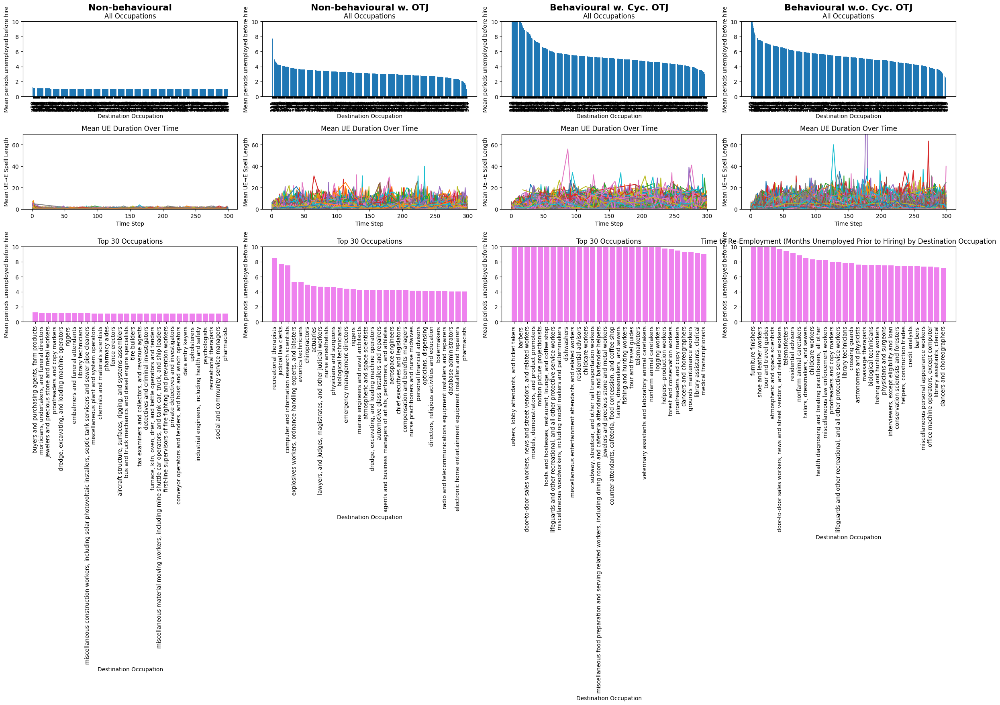

In [14]:
fig, axes = plt.subplots(3, 4, figsize=(24, 18))
model_names = filtered_time_to_emps.keys()
for col, i in enumerate(model_names):
    # 1. Bar plot (all occupations)
    mean_ue_by_dest = (
        filtered_time_to_emps[i]
        .groupby('DestinationOccupation', as_index=True)['UEDuration']
        .mean()
        .sort_values(ascending=False)
    )
    x = np.arange(len(mean_ue_by_dest))
    axes[0, col].bar(x, mean_ue_by_dest.values)
    axes[0, col].set_xticks(x)
    axes[0, col].set_xticklabels(mean_ue_by_dest.index.astype(str), rotation=90)
    axes[0, col].set_ylabel('Mean periods unemployed before hire')
    axes[0, col].set_xlabel('Destination Occupation')
    axes[0, col].set_title(f'All Occupations')
    axes[0,col].set_ylim(0,10)
    
    # 2. Bar plot (top 30 occupations)
    mean_ue_by_dest_short = mean_ue_by_dest.iloc[0:30]
    x_short = np.arange(len(mean_ue_by_dest_short))
    # Get labels from tmp for each occupation, fallback to Occ {id}
    labels_short = [tmp.loc[occ, 'label'] if occ in tmp.index else f'Occ {occ}' for occ in mean_ue_by_dest_short.index]
    axes[2, col].bar(x_short, mean_ue_by_dest_short.values, color="violet")
    axes[2, col].set_xticks(x_short)
    axes[2, col].set_xticklabels(labels_short, rotation=90)
    axes[2, col].set_ylabel('Mean periods unemployed before hire')
    axes[2, col].set_xlabel('Destination Occupation')
    axes[2, col].set_title(f'Top 30 Occupations')
    axes[2,col].set_ylim(0,10)

    
    # 3. Line plot (mean UE duration by origin occupation and time step)
    mean_ue_by_dest_time = (
        filtered_time_to_emps[i]
        .groupby(['DestinationOccupation', 'Time Step'])['UEDuration']
        .mean()
        .reset_index()
    )
    # mean_ue_by_origin_time = mean_ue_by_origin_time.loc[
    #     mean_ue_by_origin_time['DestinationOccupation'].isin(mean_ue_by_origin_short.index)
    # ]
    for occ in mean_ue_by_dest_time['DestinationOccupation'].unique():
        group = mean_ue_by_dest_time[mean_ue_by_dest_time['DestinationOccupation'] == occ]
        label = tmp.loc[occ, 'label'] if occ in tmp.index else f'Occ {occ}'
        axes[1, col].plot(group['Time Step'], group['UEDuration'], label=label)
    axes[1, col].set_xlabel('Time Step')
    axes[1, col].set_ylabel('Mean UE→E Spell Length')
    axes[1, col].set_title(f'Mean UE Duration Over Time')
    axes[1,col].set_ylim(0,70)

    #if col == 0:
    #    axes[2, col].legend(ncol=1, fontsize='small', bbox_to_anchor=(1.05, 1), loc='upper left')
    # Column label
    axes[0, col].annotate(i, xy=(0.5, 1.15), xycoords='axes fraction', ha='center', fontsize=16, fontweight='bold')

plt.title("Time to Re-Employment (Months Unemployed Prior to Hiring) by Destination Occupation")
plt.tight_layout()
plt.show()

Occupations with upward unemployment trend:


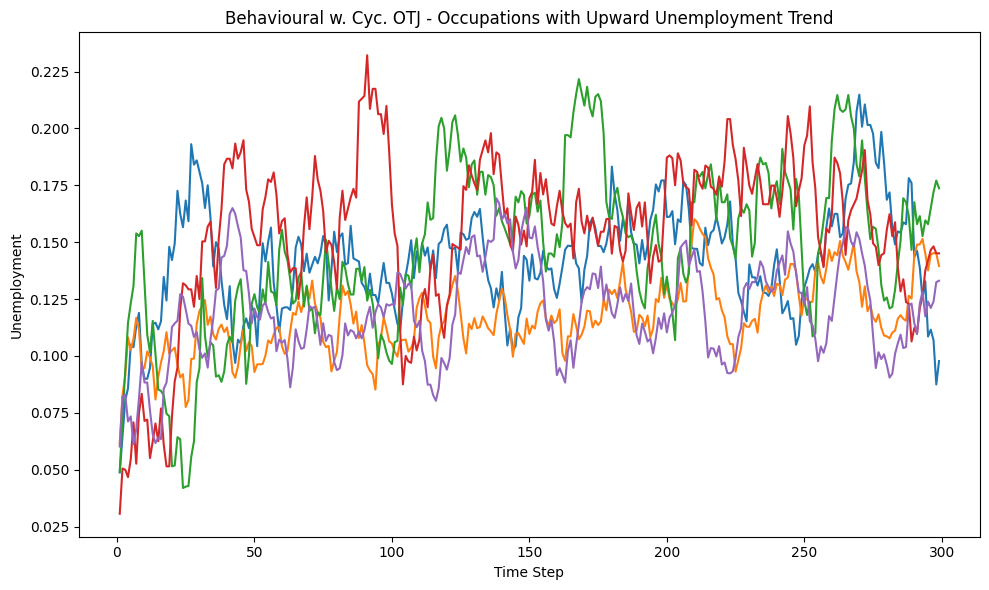

Occupations with upward unemployment trend:


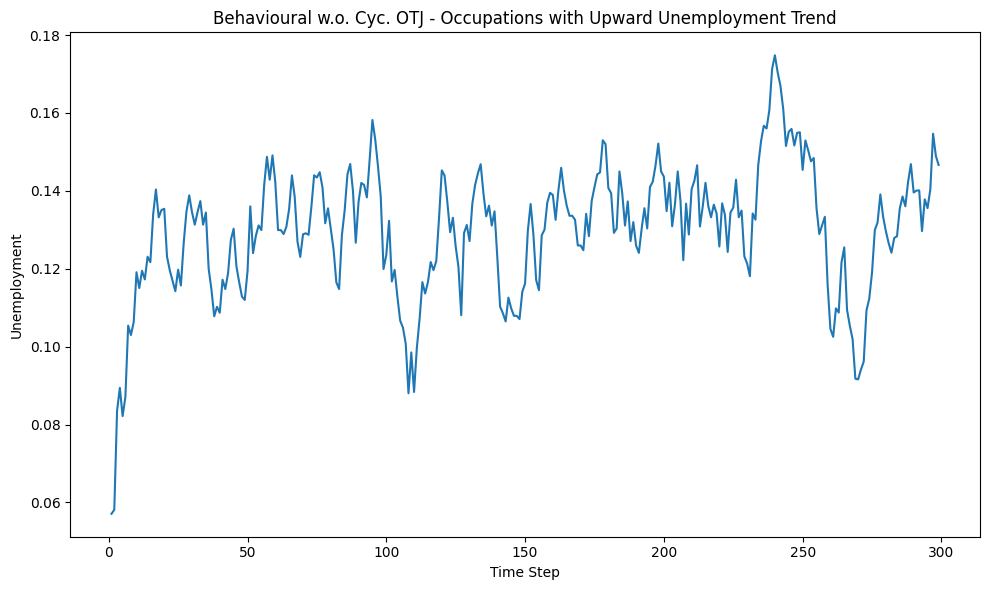

In [15]:

def plot_trending_unemp(model_res, threshold, mod_label):
    # Compute slope of unemployment over time for each occupation
    slopes = {}
    mods = model_res[mod_label]
    for occ, group in mods.groupby('Occupation'):
        x = group['Time Step'].values
        y = group['Unemployment'].values
        if len(x) > 1:
            slope, intercept = np.polyfit(x, y, 1)  # linear fit
            slopes[occ] = slope
        else:
            slopes[occ] = np.nan

    slopes_series = pd.Series(slopes, name='Slope')

    upward_occs = slopes_series[slopes_series > 0.05].sort_values(ascending=False)
    print("Occupations with upward unemployment trend:")

    # Plot only the ones with the strongest upward trend
    top_upward = upward_occs.index

    plt.figure(figsize=(10, 6))
    for occ, group in mods[mods['Occupation'].isin(top_upward)].groupby('Occupation'):
        # Use tmp to get real label; fallback to occ if not found
        label = tmp['label'].loc[occ] if occ in tmp.index else f'Occ {occ}'
        plt.plot(group['Time Step'], group['UER'], label=label)

    plt.xlabel('Time Step')
    plt.ylabel('Unemployment')
    plt.title(f'{mod_label} - Occupations with Upward Unemployment Trend')
    handles, labels = plt.gca().get_legend_handles_labels()
    sorted_pairs = sorted(zip(labels, handles), key=lambda x: x[0])
    sorted_labels, sorted_handles = zip(*sorted_pairs)
    #plt.legend(sorted_handles, sorted_labels, ncol=1, fontsize='small', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

    return top_upward

for name in ["Behavioural w. Cyc. OTJ", "Behavioural w.o. Cyc. OTJ"]: # "Non-behavioural", "Non-behavioural w. OTJ",
    trending_occs = plot_trending_unemp(filtered_sim_results, 0.05, name)


In [16]:
# def plot_occupation_makeup(model_res, total: False):
#     if total:
#         plt.figure(figsize=(10, 6))
#         for id, name in model_res.items():
#             plt.plot(model_res[id]['Time Step'],model_res[id]['Retirees'], label=id)
#         plt.xlabel('Time Step')
#         plt.ylabel('Retirees')
#         plt.title(f'{id} - Total Retirees')
#         plt.legend()
#         plt.tight_layout()
#         plt.show()
#     else:
#         for id, name in model_res.items():
#             plt.figure(figsize=(10, 6))
#             for occ in np.unique(model_res[id]['Occupation']):
#                 xs = model_res[id][model_res[id]['Occupation'] == occ]
#                 plt.plot(range(len(xs)), xs['Retirees'], label=f'{id} - {occ}')
#             plt.xlabel('Time Step')
#             plt.ylabel('Retirees')
#             plt.title(f'{id} - Total Retirees')
#             plt.tight_layout()
#             plt.show()


# plot_occupation_makeup(filtered_sim_results, total = False)
# plot_occupation_makeup(filtered_model_results, total = True)

/var/folders/34/6r0xdq916zn1qsvypkxnsqkw0000gr/T/ipykernel_79734/3253321617.py:121: UserWarning: 

The arrowstyle keyword argument is not applicable when drawing edges
with LineCollection.

To make this warning go away, either specify `arrows=True` to
force FancyArrowPatches or use the default value for arrowstyle.
Note that using FancyArrowPatches may be slow for large graphs.

  nx.draw_networkx_edges(G, pos, width=widths, alpha=0.6, arrows=directed, arrowstyle="-|>", arrowsize=10)


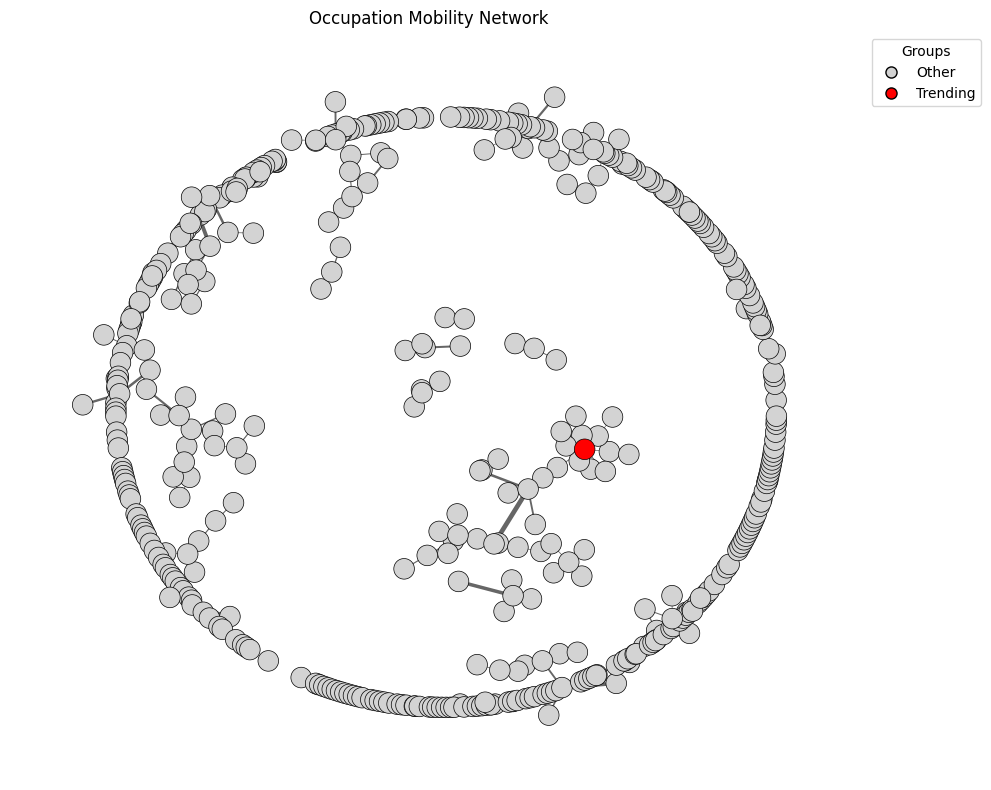

In [17]:
# Network graph from adjacency matrix (weighted, colored by node name)
# Requires: networkx, matplotlib, numpy, pandas
import networkx as nx
from matplotlib.lines import Line2D

def plot_network_from_matrix(
    A,
    directed=False,
    threshold=0.0,
    abs_threshold=False,
    normalize_edge_widths=True,
    max_edge_width=4.0,
    layout="spring",            # "spring" | "kamada_kawai" | "spectral" | "circular"
    seed=42,
    node_size=220,
    color_key=None,             # function: name -> group string; or dict {name: group}
    palette=None,               # dict {group: color} or None -> auto colormap
    title="Network graph",
):
    """
    A: adjacency as pd.DataFrame (preferred; index=columns=names) or np.ndarray.
       If ndarray, nodes will be named 'N0','N1',... and treated as undirected unless directed=True.
    directed: build DiGraph if True, else Graph.
    threshold: drop edges with weight <= threshold (or <= |threshold| if abs_threshold=True).
    abs_threshold: if True, threshold on absolute value.
    normalize_edge_widths: scale edge widths to [0, max_edge_width].
    color_key: 
        - function taking node name -> group label (str), or
        - dict mapping node name -> group, or
        - None to color all nodes the same.
    palette: dict mapping group -> matplotlib color. If None, auto-assign from tab20.
    """
    # ----- Standardize input -----
    if isinstance(A, pd.DataFrame):
        names = A.index.astype(str).tolist()
        assert list(A.columns.astype(str)) == names, "Adjacency DataFrame must have matching index/columns (same order)."
        M = A.values.astype(float)
    else:
        A = np.asarray(A, dtype=float)
        names = [f"N{i}" for i in range(A.shape[0])]
        M = A

    n = len(names)
    if M.shape[0] != n or M.shape[1] != n:
        raise ValueError("Adjacency matrix must be square.")

    # ----- Build graph -----
    G = nx.DiGraph() if directed else nx.Graph()
    G.add_nodes_from(names)

    # Add edges with weights (sparsify by threshold)
    for i in range(n):
        for j in range(n):
            if i == j:
                continue
            w = M[i, j]
            val = abs(w) if abs_threshold else w
            if val > threshold and w != 0:
                # For undirected matrices, avoid double-add: only i<j
                if not directed and j <= i:
                    continue
                G.add_edge(names[i], names[j], weight=float(w))

    if G.number_of_edges() == 0:
        print("No edges after thresholding.")
        return

    # ----- Layout -----
    rng = np.random.default_rng(seed)
    if layout == "spring":
        pos = nx.spring_layout(G, seed=seed, k=None)  # k=None lets NX choose based on log(n)
    elif layout == "kamada_kawai":
        pos = nx.kamada_kawai_layout(G)
    elif layout == "spectral":
        pos = nx.spectral_layout(G)
    elif layout == "circular":
        pos = nx.circular_layout(G)
    else:
        pos = nx.spring_layout(G, seed=seed)

    # ----- Node colors by index name -----
    # Build group per node
    if color_key is None:
        node_groups = {name: "All" for name in names}
    elif callable(color_key):
        node_groups = {name: str(color_key(name)) for name in names}
    elif isinstance(color_key, dict):
        node_groups = {name: str(color_key.get(name, "Other")) for name in names}
    else:
        raise TypeError("color_key must be None, function(name)->group, or dict {name: group}")

    groups = pd.Index(node_groups.values()).unique().tolist()
    # Palette
    if palette is None:
        # auto colors from tab20 (recycle if needed)
        base = plt.get_cmap("tab20").colors
        palette = {g: base[i % len(base)] for i, g in enumerate(groups)}
    else:
        # ensure all groups get a color
        for g in groups:
            palette.setdefault(g, "gray")

    node_colors = [palette[node_groups[name]] for name in names]

    # ----- Edge widths -----
    weights = np.array([d["weight"] for _, _, d in G.edges(data=True)], dtype=float)
    if normalize_edge_widths:
        wmin, wmax = np.nanmin(np.abs(weights)), np.nanmax(np.abs(weights))
        # avoid div-by-zero
        if wmax > 0:
            widths = (np.abs(weights) - wmin) / (wmax - wmin + 1e-12) * max_edge_width
            widths = np.clip(widths, 0.5, max_edge_width)
        else:
            widths = np.full_like(weights, 1.5)
    else:
        widths = np.clip(np.abs(weights), 0.5, max_edge_width)

    # ----- Draw -----
    plt.figure(figsize=(10, 8))
    nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=node_size, linewidths=0.5, edgecolors="black")
    nx.draw_networkx_edges(G, pos, width=widths, alpha=0.6, arrows=directed, arrowstyle="-|>", arrowsize=10)
    # If graph is not too large, label nodes
    if len(names) <= 60:
        nx.draw_networkx_labels(G, pos, font_size=8)

    # Legend for groups
    legend_handles = [Line2D([0], [0], marker='o', color='w',
                             label=str(g), markerfacecolor=palette[g],
                             markersize=8, markeredgecolor="black")
                      for g in groups]
    plt.legend(handles=legend_handles, title="Groups", bbox_to_anchor=(1.02, 1), loc="upper left")
    plt.axis("off")
    plt.title(title)
    plt.tight_layout()
    plt.show()

# ===== Example usage =====
# Suppose `A_df` is a pandas DataFrame (index=columns=occupation names) with weights.
# Color nodes by index name rule: e.g., prefix-based grouping.
# def my_color_key(name):
#     # Example rules – adapt to your naming convention
#     if name.startswith("Sales"): return "Sales"
#     if name.startswith("Tech"):  return "Tech"
#     if "Manager" in name:        return "Management"
#     return "Other"

def color_key(name):
    # If this node is in trending_occs, mark it "Trending"
    return "Trending" if int(name) in trending_occs else "Other"

palette = {
    "Trending": "red",
    "Other": "lightgray"
}

plot_network_from_matrix(mod_data['A'], 
                         layout = "kamada_kawai", directed=False, threshold=0.05,
                         color_key=color_key, 
                         palette = palette,
                         title="Occupation Mobility Network")

# Or if you have a Series mapping id->group:
# group_map = tmp  # pandas Series where index=occupation name/id, value=group string
# plot_network_from_matrix(A_df, threshold=0.1, color_key=group_map.to_dict())

/var/folders/34/6r0xdq916zn1qsvypkxnsqkw0000gr/T/ipykernel_79734/2000073146.py:85: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


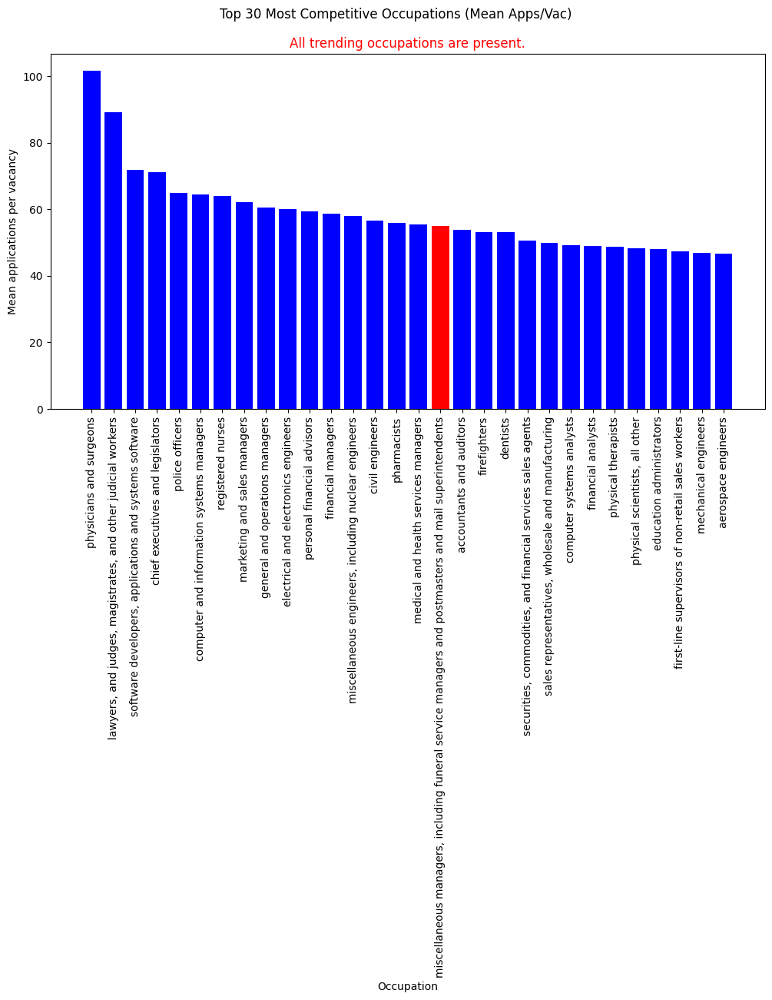

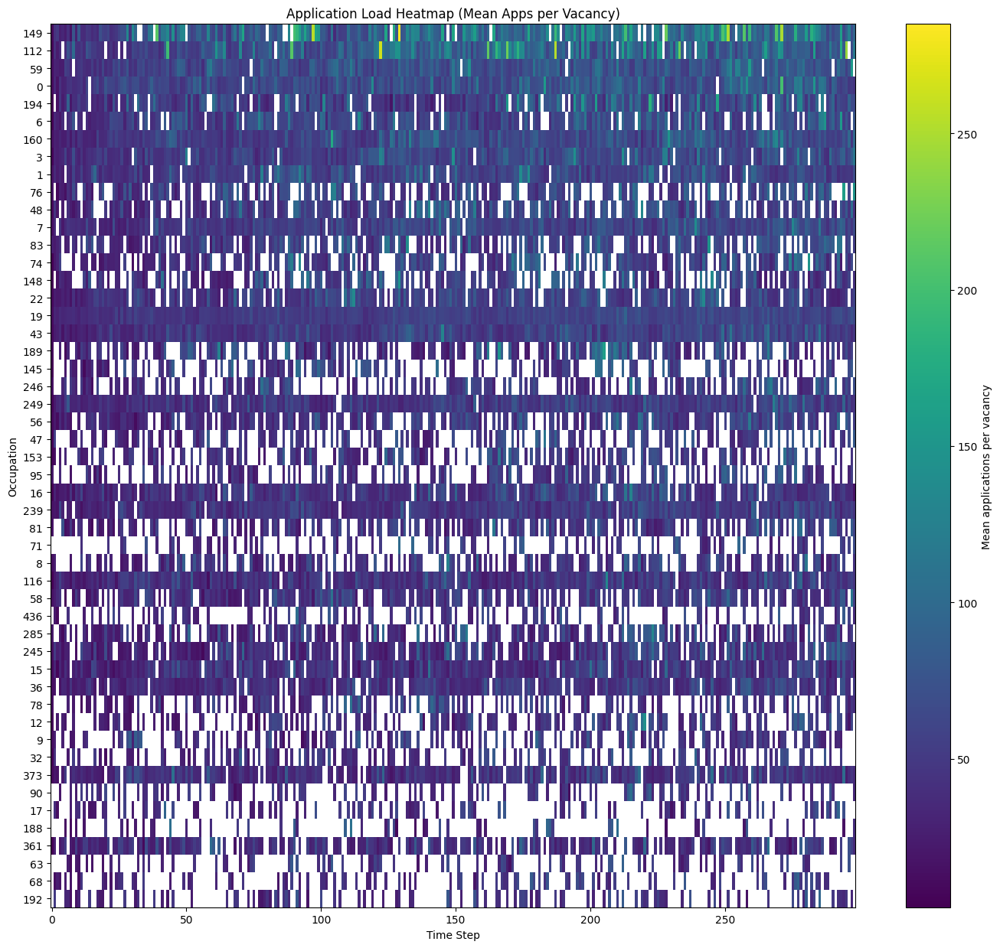

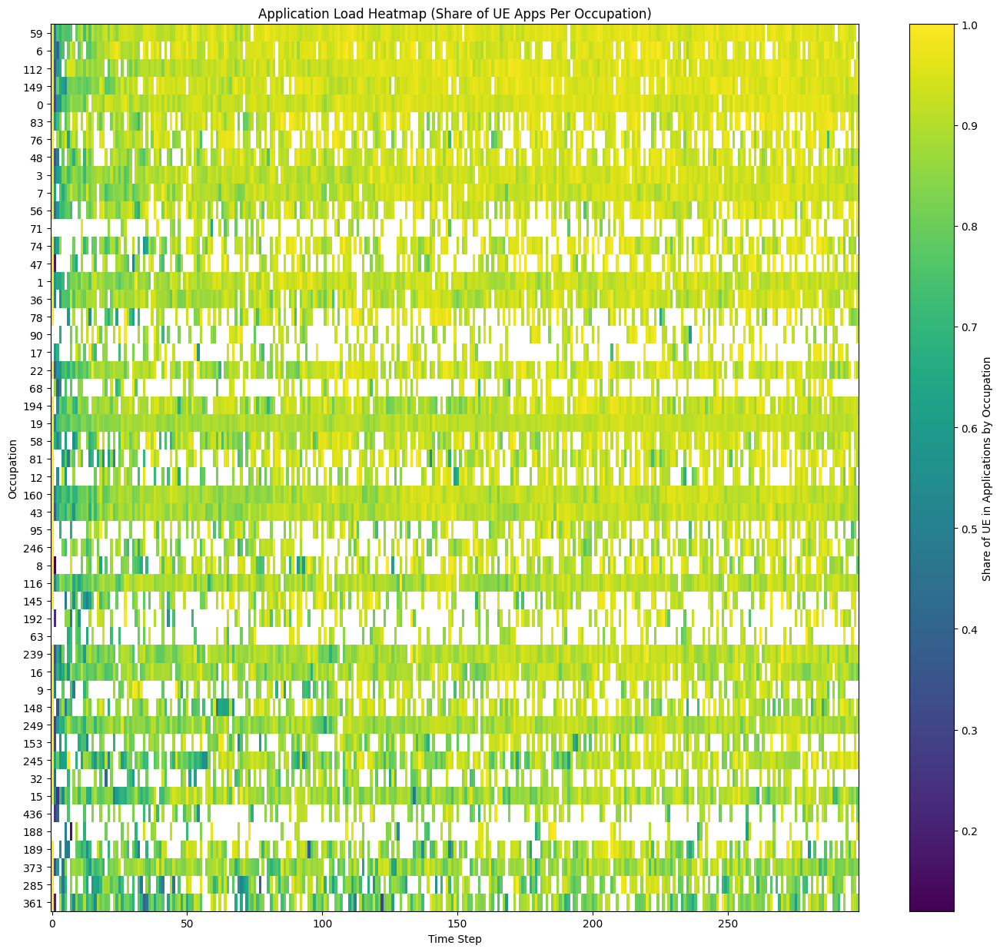

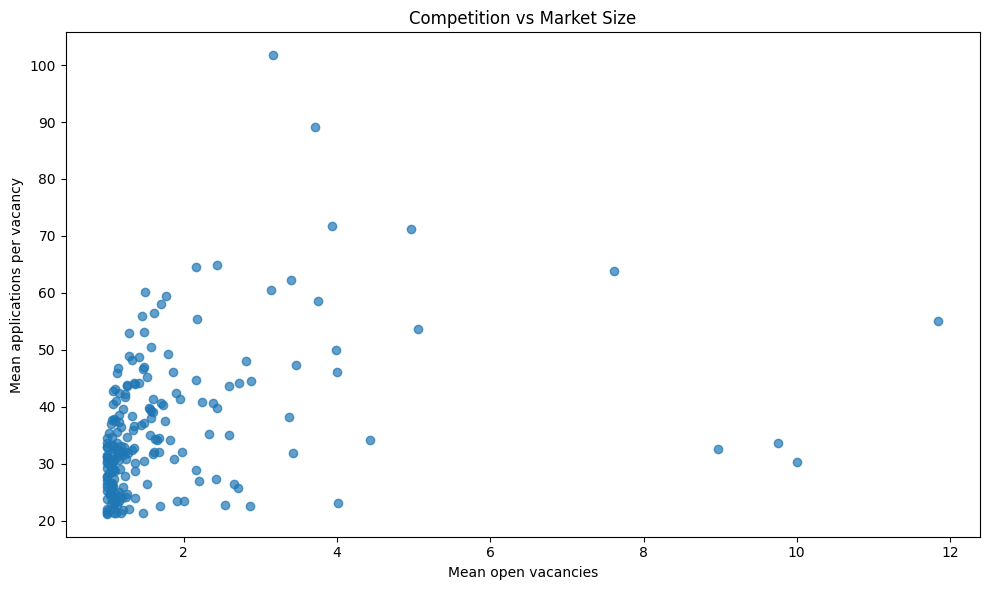

In [18]:


def summarize_app_load(app_load_df: pd.DataFrame) -> pd.DataFrame:
    """
    Build per-occupation summary stats of application congestion.
    Expects columns: ['Time Step','Occupation','OpenVacs','TotalApplicants','MeanAppsPerVac','MedianAppsPerVac'].
    Returns a DataFrame indexed by Occupation with mean/median/p90 of apps per vacancy and share of zero-applicant vacancies.
    """
    df = app_load_df.copy()
    # Basic guards
    needed = {'Time Step','Occupation','OpenVacs','TotalApplicants','MeanAppsPerVac','MedianAppsPerVac'}
    missing = needed - set(df.columns)
    if missing:
        raise ValueError(f"app_load_df missing columns: {missing}")

    # We can also recompute AppsPerVac per vacancy-level if ever needed; here we use the aggregated 'MeanAppsPerVac'
    grp = df.groupby('Occupation', as_index=True)

    # Robust p90 across time
    p90 = grp['MeanAppsPerVac'].quantile(0.90)

    # Fraction of time steps with zero-applicant vacancies (proxy for “thin markets”)
    # First compute share of vacancies with applicants at each time step:
    # If TotalApplicants == 0 while OpenVacs > 0, then all those vacancies had zero applicants this step.
    step_zero_share = df.assign(
        ZeroShare=np.where(df['OpenVacs'] > 0, (df['OpenVacs'] - (df['TotalApplicants'] > 0).astype(int)) / df['OpenVacs'], np.nan)
    )
    # The above is a crude proxy; better is vacancy-level data. If not available, we can at least flag steps with TotalApplicants == 0.
    step_zero_any = df.assign(ZeroAny=np.where((df['OpenVacs'] > 0) & (df['TotalApplicants'] == 0), 1.0, 0.0))

    summary = pd.DataFrame({
        'MeanAppsPerVac' : grp['MeanAppsPerVac'].mean(),
        'MedianAppsPerVac' : grp['MedianAppsPerVac'].median(),
        'P90_AppsPerVac' : p90,
        # Share of steps with zero applicants across all vacancies in that occupation (any-zero flag)
        'ShareStepsZeroApplicants' : step_zero_any.groupby('Occupation')['ZeroAny'].mean(),
        # Mean number of open vacancies (helps context when ranking)
        'MeanOpenVacs' : grp['OpenVacs'].mean(),
    })

    return summary.sort_values('MeanAppsPerVac', ascending=False)

def _apply_label_map(index_values, label_map: pd.Series | dict | None):
    """
    Optional: turn Occupation IDs into human-readable labels using a Series/dict (e.g., tmp).
    """
    if label_map is None:
        return index_values.astype(str)
    if isinstance(label_map, dict):
        return np.array([label_map.get(i, str(i)) for i in index_values])
    if isinstance(label_map, pd.Series):
        return np.array([label_map.get(i, str(i)) for i in index_values])
    return index_values.astype(str)

# ========= Plots =========
def plot_topk_mean_apps(summary_df: pd.DataFrame, topk: int = 30, label_map=None, title=None):
    """
    Bar chart of top-k occupations by MeanAppsPerVac (higher = more competition).
    """
    s = summary_df.sort_values('MeanAppsPerVac', ascending=False).head(topk)
    labels = _apply_label_map(s.index, label_map)

    if len(set(trending_occs)-set(s.index)) == 0:
        subt = f'All trending occupations are present.'
    else:
        subt = f'Missing trending occs: {set(trending_occs)-set(s.index)}'

    labels = []
    for occ in s.index:
        label = tmp['label'].loc[occ] if occ in tmp.index else f'Occ {occ}'
        labels.append(label)

    plt.figure(figsize=(12, 6))

    for i in range(len(s)):
        if s.index[i] in trending_occs:
            color = "red"
        else:
            color = "blue"
        plt.bar(i, s['MeanAppsPerVac'].iloc[i], color=color)

    plt.xticks(np.arange(len(s)), labels, rotation=90)
    plt.ylabel('Mean applications per vacancy')
    plt.xlabel('Occupation')
    plt.suptitle(title if title else f'Top {topk} Most Competitive Occupations (Mean Apps/Vac)')
    plt.title(subt, color = "red")
    plt.tight_layout()
    plt.show()

def plot_heatmap_apps_over_time(app_load_df: pd.DataFrame, occ_ids=None, label_map=None, clim=None, title=None):
    """
    Heatmap of MeanAppsPerVac (rows = occupations, cols = time).
    If occ_ids is provided, subset to those occupations (e.g., top 50 by mean congestion).
    """
    df = app_load_df.copy()
    if occ_ids is not None:
        df = df[df['Occupation'].isin(occ_ids)]

    pivot = df.pivot_table(index='Occupation', columns='Time Step', values='MeanAppsPerVac', aggfunc='mean')
    # Order rows by overall mean congestion for readability
    order = pivot.mean(axis=1).sort_values(ascending=False).index
    pivot = pivot.loc[order]

    plt.figure(figsize=(14, max(6, 0.25 * len(pivot))))
    im = plt.imshow(pivot.values, aspect='auto', interpolation='nearest')
    if clim:
        im.set_clim(*clim)
    plt.colorbar(im, label='Mean applications per vacancy')
    # Y tick labels (mapped)
    ylabels = _apply_label_map(pivot.index.to_numpy(), label_map)
    plt.yticks(np.arange(len(pivot)), ylabels)
    plt.xlabel('Time Step')
    plt.ylabel('Occupation')
    plt.title(title if title else 'Application Load Heatmap (Mean Apps per Vacancy)')
    plt.tight_layout()
    plt.show()


def plot_heatmap_u_share_apps_over_time(app_load_df: pd.DataFrame, occ_ids=None, label_map=None, clim=None, title=None):
    """
    Heatmap of 'MeanUnempAppsPerVac' (rows = occupations, cols = time).
    If occ_ids is provided, subset to those occupations (e.g., top 50 by mean congestion).
    Y-axis is sorted by mean value of each occupation (row).
    """
    df = app_load_df.copy()
    if occ_ids is not None:
        df = df[df['Occupation'].isin(occ_ids)]

    pivot = df.pivot_table(index='Occupation', columns='Time Step', values='MeanUnempAppsPerVac', aggfunc='mean')
    # Sort y-axis by mean value of each row (occupation)
    order = pivot.mean(axis=1).sort_values(ascending=False).index
    pivot = pivot.loc[order]

    plt.figure(figsize=(14, max(6, 0.25 * len(pivot))))
    im = plt.imshow(pivot.values, aspect='auto', interpolation='nearest')
    if clim:
        im.set_clim(*clim)
    plt.colorbar(im, label='Share of UE in Applications by Occupation')
    # Y tick labels (mapped)
    ylabels = _apply_label_map(pivot.index.to_numpy(), label_map)
    plt.yticks(np.arange(len(pivot)), ylabels)
    plt.xlabel('Time Step')
    plt.ylabel('Occupation')
    plt.title(title if title else 'Application Load Heatmap (Share of UE Apps Per Occupation)')
    plt.tight_layout()
    plt.show()

def plot_scatter_apps_vs_vacs(summary_df: pd.DataFrame, label_map=None, topk=None, title=None):
    """
    Scatter of competition vs market size: MeanAppsPerVac (y) vs MeanOpenVacs (x).
    High y at moderate/high x are the “hottest” markets.
    """
    s = summary_df.copy()
    if isinstance(topk, int):
        s = s.sort_values('MeanAppsPerVac', ascending=False).head(topk)

    plt.figure(figsize=(10, 6))
    plt.scatter(s['MeanOpenVacs'], s['MeanAppsPerVac'], alpha=0.7)
    plt.xlabel('Mean open vacancies')
    plt.ylabel('Mean applications per vacancy')
    plt.title(title if title else 'Competition vs Market Size')
    plt.tight_layout()
    plt.show()

label_map = None  # set to tmp if you want names instead of IDs

# Build per-occupation summaries
summary = summarize_app_load(filtered_app_loads['Behavioural w. Cyc. OTJ'])

# Bar chart: who is most competitive on average?
plot_topk_mean_apps(summary, topk=30, label_map=label_map)

# Heatmap: where/when congestion spikes (subset to top 50 if you have many occupations)
top50_ids = summary.head(50).index
plot_heatmap_apps_over_time(filtered_app_loads['Behavioural w. Cyc. OTJ'], occ_ids=top50_ids, label_map=label_map)

plot_heatmap_u_share_apps_over_time(filtered_app_loads['Behavioural w. Cyc. OTJ'], occ_ids=top50_ids, label_map=label_map)

# Competition vs market size (optional)
plot_scatter_apps_vs_vacs(summary, label_map=label_map, topk=200)


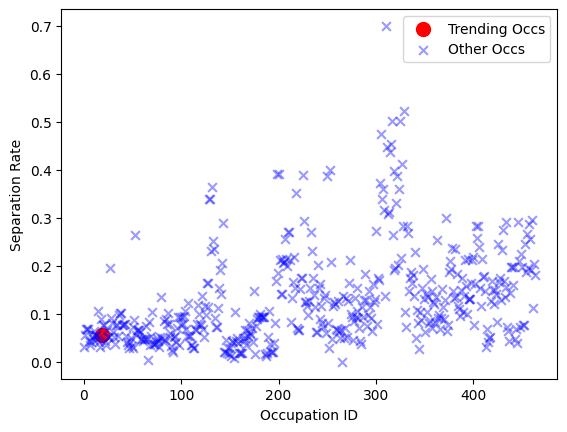

In [19]:
# Prepare colors and markers
indices = mod_data['separation_rates'].index
sep_rates = mod_data['separation_rates'].values

is_trending = indices.isin(trending_occs)

# Plot trending (red circles)
plt.scatter(indices[is_trending], sep_rates[is_trending], color='red', marker='o', s=100, label='Trending Occs')

# Plot non-trending (blue transparent crosses)
plt.scatter(indices[~is_trending], sep_rates[~is_trending], color='blue', marker='x', s=40, alpha=0.4, label='Other Occs')

plt.xlabel('Occupation ID')
plt.ylabel('Separation Rate')
plt.legend()
plt.show()

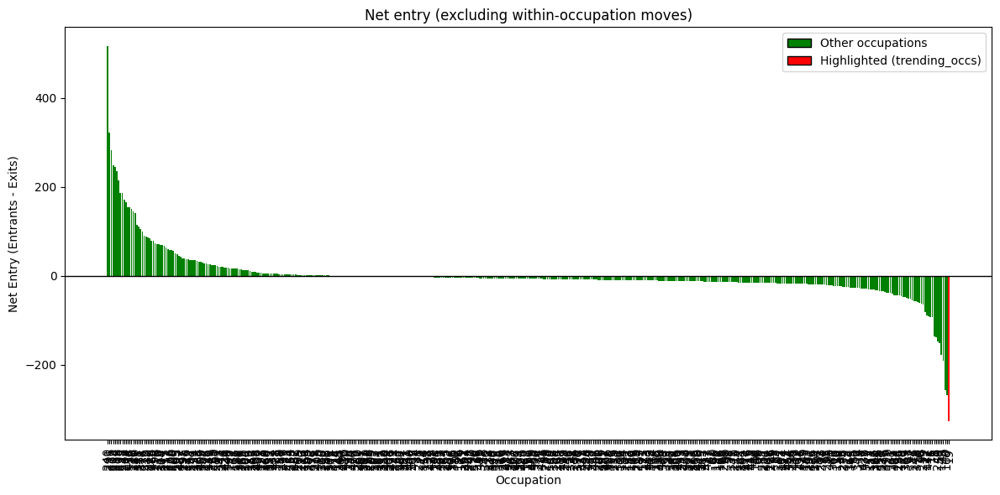

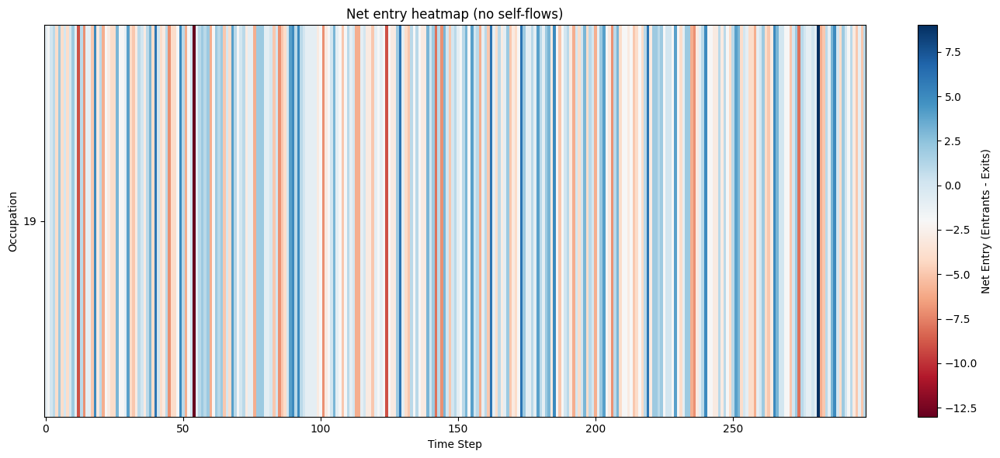

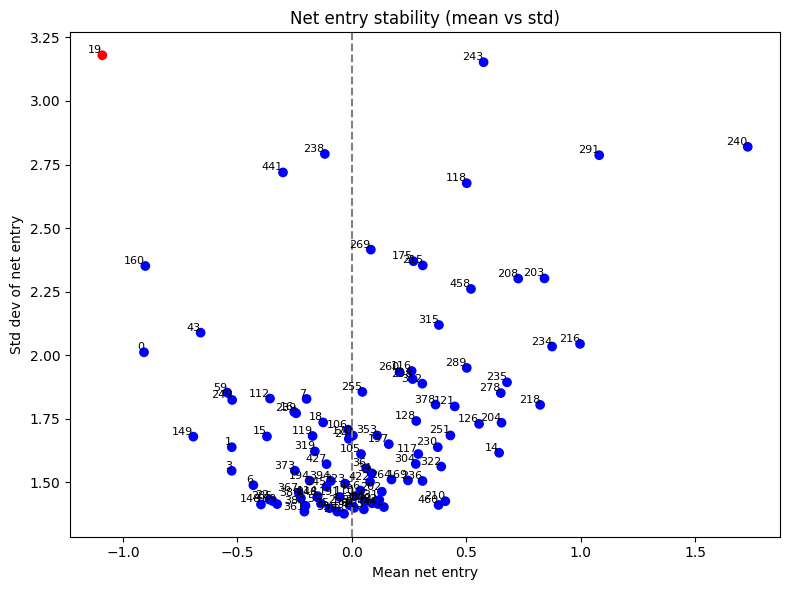

In [20]:
# ===== Core: exclude same-occupation moves when counting entrants/exits =====
def _filter_cross_occ(df: pd.DataFrame, ignore_within: bool = True) -> pd.DataFrame:
    """Optionally drop rows where OriginOccupation == DestinationOccupation."""
    if ignore_within:
        return df[df['OriginOccupation'] != df['DestinationOccupation']]
    return df

# ===== Net entry (window summary) =====
def compute_net_entry(ue_spell_origin_df: pd.DataFrame, label_map=None, time_range=None, ignore_within: bool = True):
    """
    NetEntry_i = Entrants_i - Exits_i, excluding self-flows if ignore_within=True.
    ue_spell_origin_df columns: ['Time Step','OriginOccupation','DestinationOccupation','UEDuration']
    """
    df = ue_spell_origin_df.copy()
    if time_range is not None:
        tmin, tmax = time_range
        df = df[(df['Time Step'] >= tmin) & (df['Time Step'] <= tmax)]

    df = _filter_cross_occ(df, ignore_within=ignore_within)

    entrants = df.groupby('DestinationOccupation').size().rename("Entrants")
    exits    = df.groupby('OriginOccupation').size().rename("Exits")

    net_entry = pd.concat([entrants, exits], axis=1).fillna(0)
    net_entry['NetEntry'] = net_entry['Entrants'] - net_entry['Exits']

    if label_map is not None:
        if isinstance(label_map, pd.Series):
            net_entry['Label'] = [label_map.get(i, str(i)) for i in net_entry.index]
        elif isinstance(label_map, dict):
            net_entry['Label'] = [label_map.get(i, str(i)) for i in net_entry.index]
    else:
        net_entry['Label'] = net_entry.index.astype(str)

    return net_entry.sort_values('NetEntry', ascending=False)

def plot_net_entry_highlight(net_entry: pd.DataFrame,
                             trending_occs,
                             topk: int = 40,
                             title: str = "Net entry by occupation (highlighting)"):
    """
    Bars are green by default; bars for occ IDs in trending_occs are red.
    trending_occs: iterable of occupation IDs that match net_entry.index dtype.
    """
    s = net_entry.sort_values('NetEntry', ascending=False)
    if isinstance(topk, int):
        s = s.head(topk)

    # Coerce trending ids to index dtype (robust to str/int mismatch)
    idx_dtype = s.index.dtype
    try:
        trend_set = set(pd.Index(trending_occs).astype(idx_dtype))
        key_series = s.index
    except Exception:
        trend_set = set(map(str, trending_occs))
        key_series = s.index.map(str)

    labels = s['Label'] if 'Label' in s.columns else s.index.astype(str)
    x = np.arange(len(s))
    colors = ['red' if key in trend_set else 'green' for key in key_series]

    plt.figure(figsize=(12, 6))
    plt.bar(x, s['NetEntry'].values, color=colors)
    plt.axhline(0, color="black", linewidth=1)
    plt.xticks(x, labels, rotation=90)
    plt.ylabel("Net Entry (Entrants - Exits)")
    plt.xlabel("Occupation")
    plt.title(title)
    from matplotlib.patches import Patch
    plt.legend(handles=[
        Patch(facecolor='green', edgecolor='black', label='Other occupations'),
        Patch(facecolor='red',   edgecolor='black', label='Highlighted (trending_occs)'),
    ], loc='best')
    plt.tight_layout(); plt.show()

def build_net_entry_timeseries(ue_spell_origin_df: pd.DataFrame, ignore_within: bool = True) -> pd.DataFrame:
    """
    Panel of net entry per occupation per time step, excluding self-flows if requested.
    Returns columns: ['Time Step','Occupation','Entrants','Exits','NetEntry']
    """
    # 1) Optionally remove within-occupation moves
    df = ue_spell_origin_df.copy()
    if ignore_within:
        df = df[df['OriginOccupation'] != df['DestinationOccupation']]

    # 2) Build entrants and exits as Series with a *consistent* MultiIndex: (Time Step, Occupation)
    entrants_ts = (
        df.groupby(['Time Step', 'DestinationOccupation'])
          .size()
          .rename('Entrants')
    )
    entrants_ts.index = pd.MultiIndex.from_tuples(
        entrants_ts.index, names=['Time Step', 'Occupation']
    )

    exits_ts = (
        df.groupby(['Time Step', 'OriginOccupation'])
          .size()
          .rename('Exits')
    )
    exits_ts.index = pd.MultiIndex.from_tuples(
        exits_ts.index, names=['Time Step', 'Occupation']
    )

    # 3) Create the union index and reindex both series to it (ensures perfect alignment)
    union_idx = entrants_ts.index.union(exits_ts.index)
    entrants_ts = entrants_ts.reindex(union_idx, fill_value=0)
    exits_ts    = exits_ts.reindex(union_idx, fill_value=0)

    # 4) Combine into a single DataFrame and compute NetEntry
    panel = pd.concat([entrants_ts, exits_ts], axis=1)
    panel['NetEntry'] = panel['Entrants'] - panel['Exits']

    # 5) Return as a tidy DataFrame with explicit columns
    panel = panel.reset_index()  # columns: Time Step, Occupation, Entrants, Exits, NetEntry
    return panel[['Time Step', 'Occupation', 'Entrants', 'Exits', 'NetEntry']]

def plot_net_entry_heatmap(net_ts: pd.DataFrame, occ_ids=None, label_map=None, title="Net entry heatmap"):
    piv = net_ts.pivot_table(index="Occupation", columns="Time Step", values="NetEntry", aggfunc="sum")
    if occ_ids is not None:
        piv = piv.loc[piv.index.intersection(occ_ids)]
    order = piv.var(axis=1).sort_values(ascending=False).index  # order by volatility
    piv = piv.loc[order]
    plt.figure(figsize=(14, max(6, 0.25*len(piv))))
    im = plt.imshow(piv.values, aspect="auto", cmap="RdBu", interpolation="nearest")
    plt.colorbar(im, label="Net Entry (Entrants - Exits)")
    labels = [label_map.get(i, str(i)) if label_map is not None else str(i) for i in piv.index]
    plt.yticks(np.arange(len(piv)), labels)
    plt.xlabel("Time Step"); plt.ylabel("Occupation")
    plt.title(title); plt.tight_layout(); plt.show()

def plot_net_entry_stability(net_ts: pd.DataFrame, 
                             label_map=None, 
                             topk=None, 
                             trending_occs=None, 
                             title="Stability of net entry"):
    """
    Scatterplot of mean vs. std dev of net entry by occupation.
    Points in trending_occs are colored red, others blue.
    """
    stats = net_ts.groupby("Occupation")["NetEntry"].agg(["mean", "std"])
    if isinstance(topk, int):
        stats = stats.sort_values("std", ascending=False).head(topk)

    # Handle type coercion between stats.index and trending_occs
    if trending_occs is not None:
        idx_dtype = stats.index.dtype
        try:
            trend_set = set(pd.Index(trending_occs).astype(idx_dtype))
            key_series = stats.index
        except Exception:
            # fallback: compare as strings
            trend_set = set(map(str, trending_occs))
            key_series = stats.index.map(str)
        colors = ["red" if k in trend_set else "blue" for k in key_series]
    else:
        colors = "blue"

    labels = [label_map.get(i, str(i)) if label_map is not None else str(i) 
              for i in stats.index]

    plt.figure(figsize=(8,6))
    plt.scatter(stats["mean"], stats["std"], c=colors)
    for x, y, lbl in zip(stats["mean"], stats["std"], labels):
        plt.text(x, y, lbl, fontsize=8, ha="right", va="bottom")
    plt.axvline(0, color="gray", linestyle="--")
    plt.xlabel("Mean net entry"); plt.ylabel("Std dev of net entry")
    plt.title(title)
    plt.tight_layout()
    plt.show()

# ===== Example usage =====
# 1) Window summary (excludes same-occupation moves by default)
net_entry = compute_net_entry(time_to_emps['otj_nonbehav'], label_map=tmp, time_range=None, ignore_within=True)
plot_net_entry_highlight(net_entry, trending_occs = trending_occs, topk=465,
                          title="Net entry (excluding within-occupation moves)")


# 2) Time-series view (stability/volatility), also excluding self-flows
net_ts = build_net_entry_timeseries(time_to_emps['otj_nonbehav'], ignore_within=True)
plot_net_entry_heatmap(net_ts, occ_ids = trending_occs, label_map=tmp, title="Net entry heatmap (no self-flows)")
plot_net_entry_stability(net_ts, label_map=tmp, topk=100, trending_occs = trending_occs, title="Net entry stability (mean vs std)")

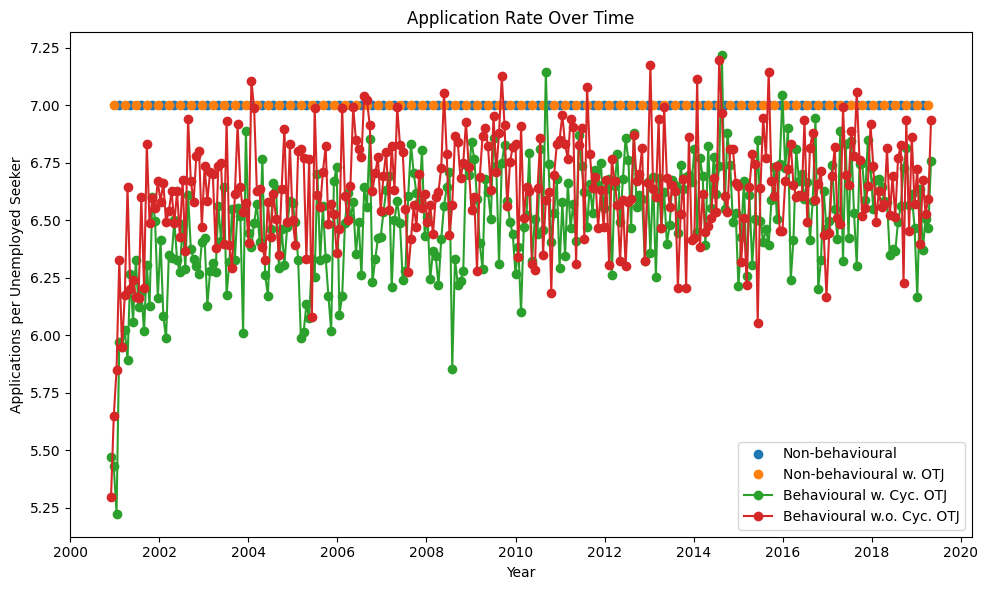

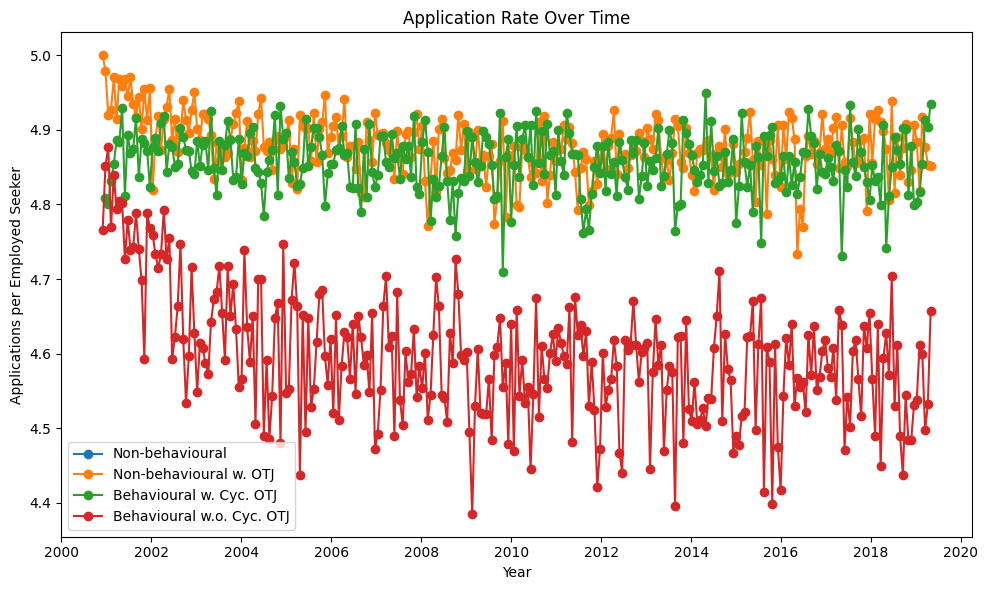

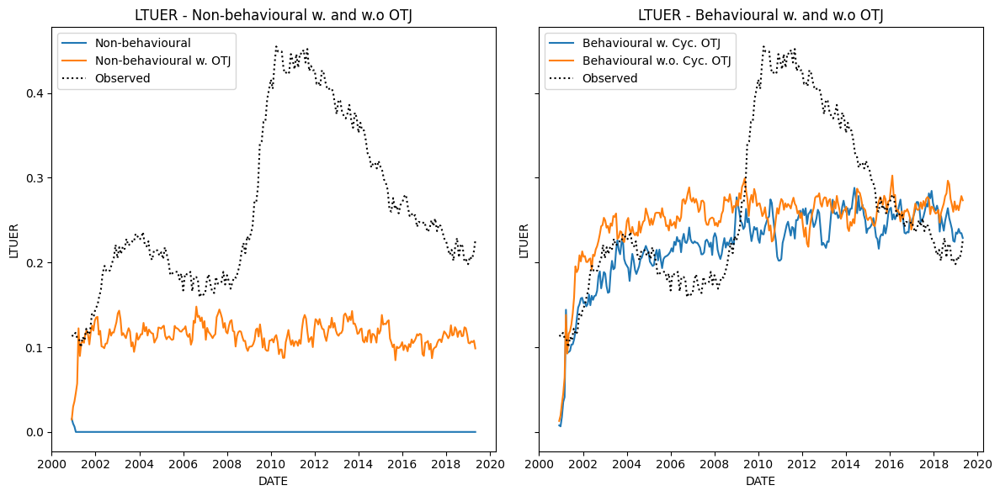

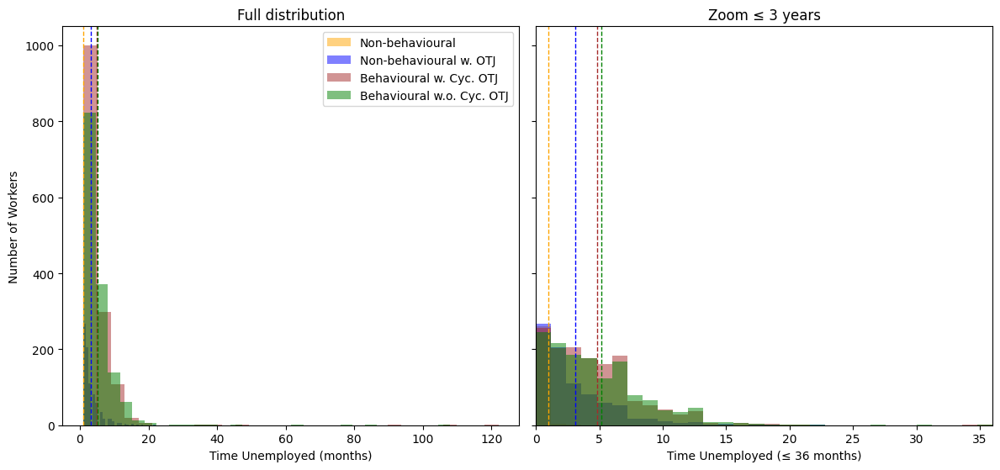

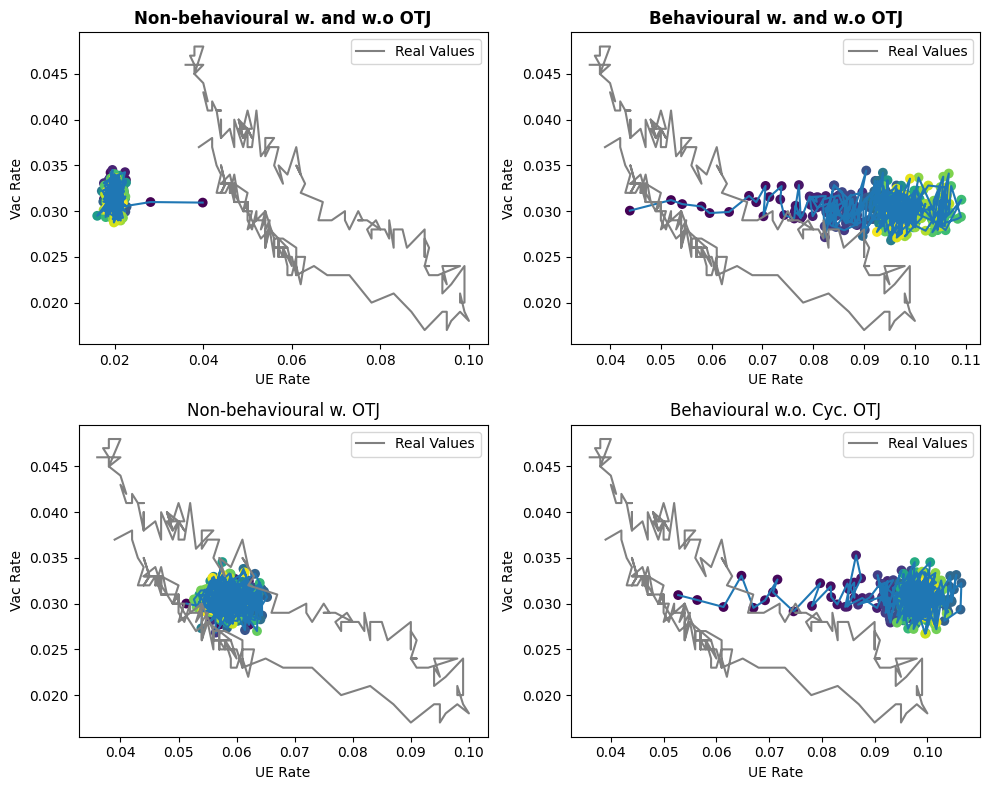

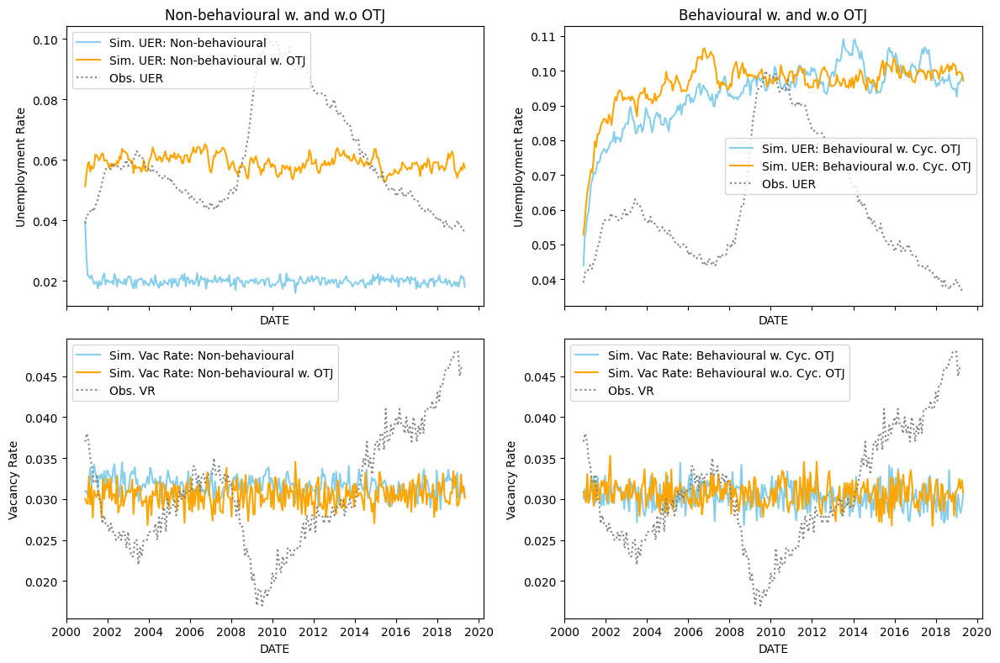

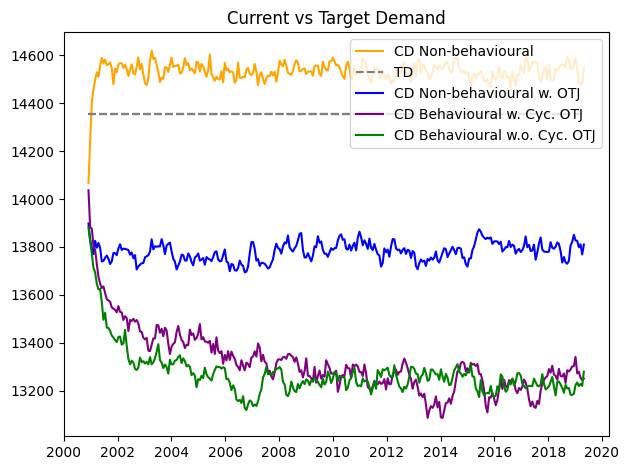

In [21]:

plt.figure(figsize=(10, 6))
for i, (name, item) in enumerate(seekers_recs.items()):
    if name == "Non-behavioural":
        # Plot every other value starting at the first place (index 0)
        plt.plot(item['DATE'][3::4], item['Application Effort (U)'][3::4], marker='o', label=f"{name}" , linestyle = "")
    elif name == "Non-behavioural w. OTJ":
        # Plot every other value starting at the second place (index 1)
        plt.plot(item['DATE'][1::4], item['Application Effort (U)'][1::4], marker='o', label=f"{name}", linestyle = "")
    else:
        plt.plot(item['DATE'], item['Application Effort (U)'], marker='o', label=name)
plt.xlabel('Year')
plt.ylabel('Applications per Unemployed Seeker')
plt.title('Application Rate Over Time')
plt.tight_layout()
plt.legend()

# Ensure the output directory exists
os.makedirs(output_path, exist_ok=True)

# Now save
plt.savefig(os.path.join(output_path, "applications_per_unemployed_seeker.png"))
plt.show()

plt.figure(figsize=(10, 6))
for i, (name, item) in enumerate(seekers_recs.items()):
    plt.plot(item['DATE'], item['Application Effort (E)'], marker='o', label=name)
plt.xlabel('Year')
plt.ylabel('Applications per Employed Seeker')
plt.title('Application Rate Over Time')
plt.tight_layout()
plt.legend()


# --- plotting with renamed keys ---
plot_ltuer(filtered_model_results, observation, 
           sep_strings=[("Non-behavioural", "Non-behavioural w. and w.o OTJ"), 
                        ("Behavioural", "Behavioural w. and w.o OTJ")], 
           sep=True, save=save_button, path=output_path)

plot_ltuer_dist(filtered_net_results, gender=False, 
                names=list(filtered_net_results.keys()), 
                save=save_button, path=output_path)

plot_bev_curve(filtered_model_results, observation, 
           sep_strings=[("Non-behavioural", "Non-behavioural w. and w.o OTJ"), 
                        ("Behavioural", "Behavioural w. and w.o OTJ")], 
               sep=True, save=save_button, path=output_path)

plot_uer_vac(filtered_model_results, observation, 
           sep_strings=[("Non-behavioural", "Non-behavioural w. and w.o OTJ"), 
                        ("Behavioural", "Behavioural w. and w.o OTJ")], 
             sep=True, save=save_button, path=output_path)


plot_cd_vs_td(filtered_model_results, save=save_button, path=output_path)




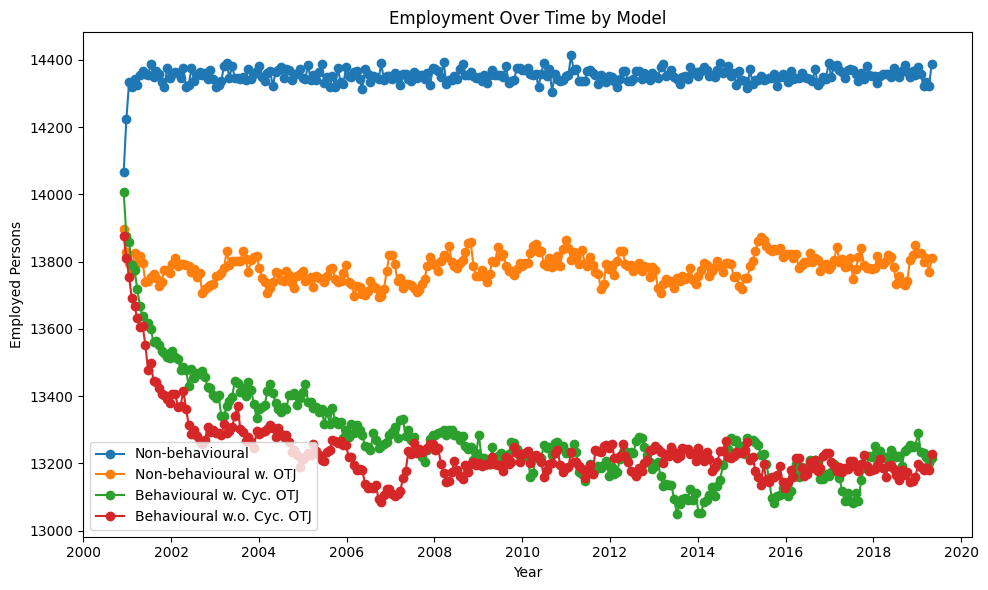

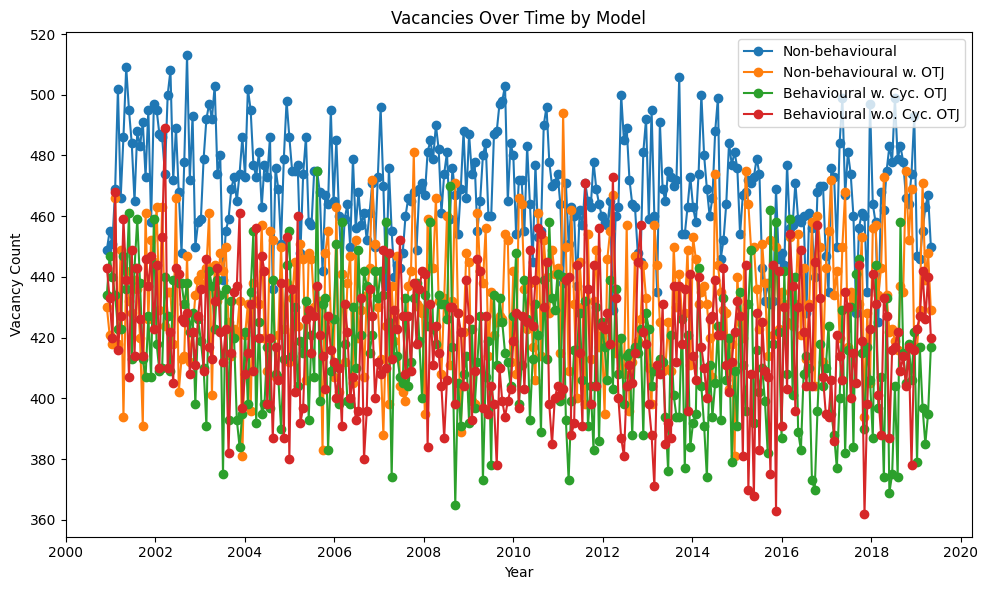

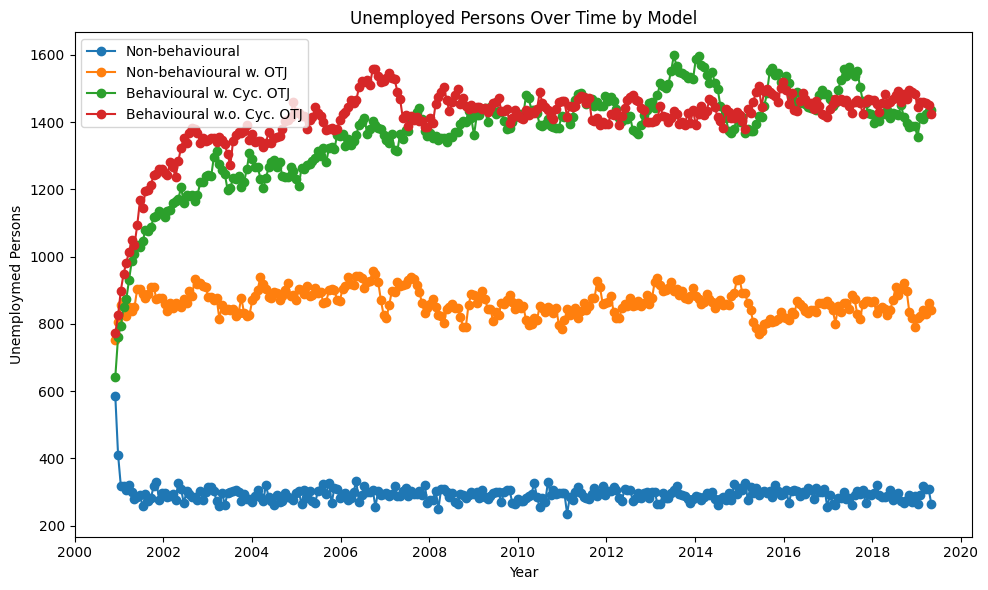

In [22]:
plt.figure(figsize=(10, 6))
for i, (name, item) in enumerate(filtered_model_results.items()):
    plt.plot(item['DATE'], item['Employment'], marker='o', label=name)
plt.xlabel('Year')
plt.ylabel('Employed Persons')
plt.title('Employment Over Time by Model')
plt.tight_layout()
plt.legend()

plt.figure(figsize=(10, 6))
for i, (name, item) in enumerate(filtered_model_results.items()):
    plt.plot(item['DATE'], item['Vacancies'], marker='o', label=name)
plt.xlabel('Year')
plt.ylabel('Vacancy Count')
plt.title('Vacancies Over Time by Model')
plt.tight_layout()
plt.legend()

plt.figure(figsize=(10, 6))
for i, (name, item) in enumerate(filtered_model_results.items()):
    plt.plot(item['DATE'], item['Unemployment'], marker='o', label=name)
plt.xlabel('Year')
plt.ylabel('Unemploymed Persons')
plt.title('Unemployed Persons Over Time by Model')
plt.tight_layout()
plt.legend()


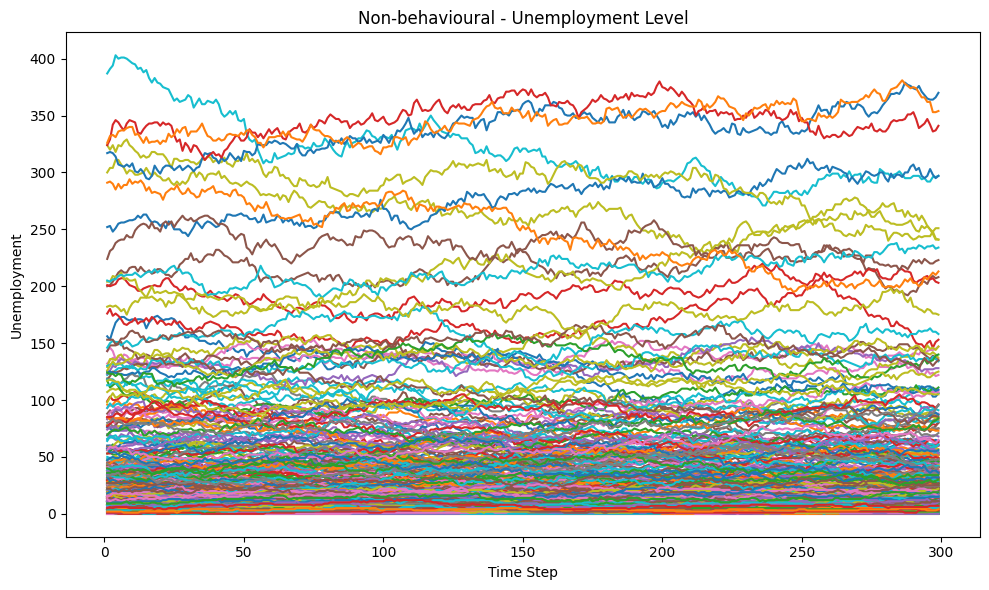

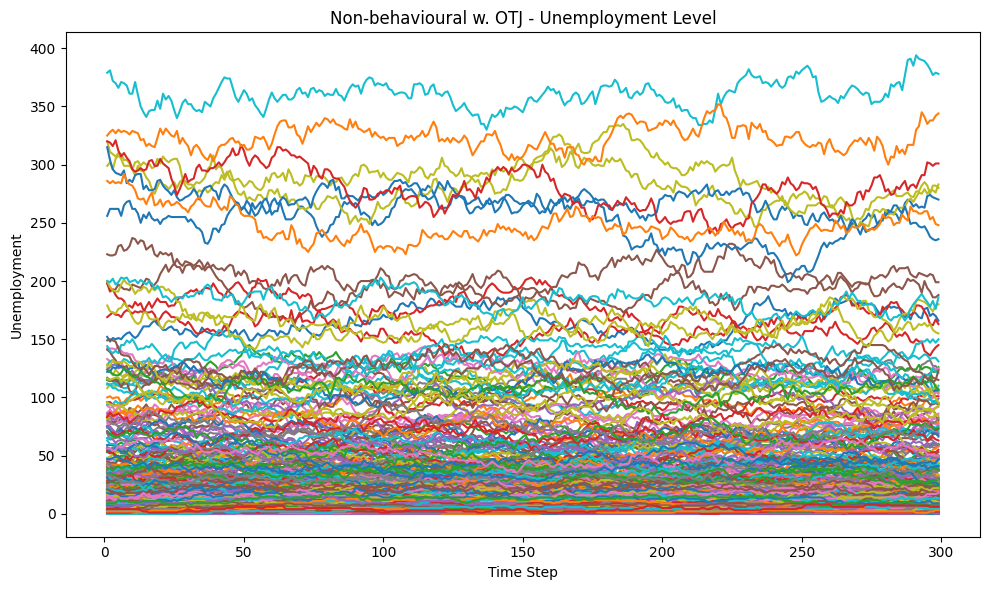

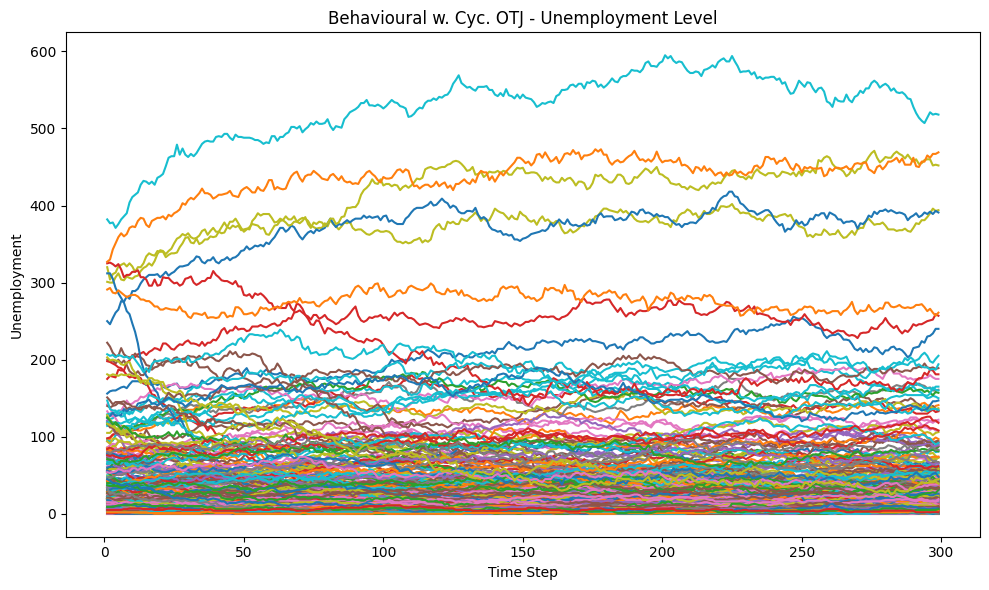

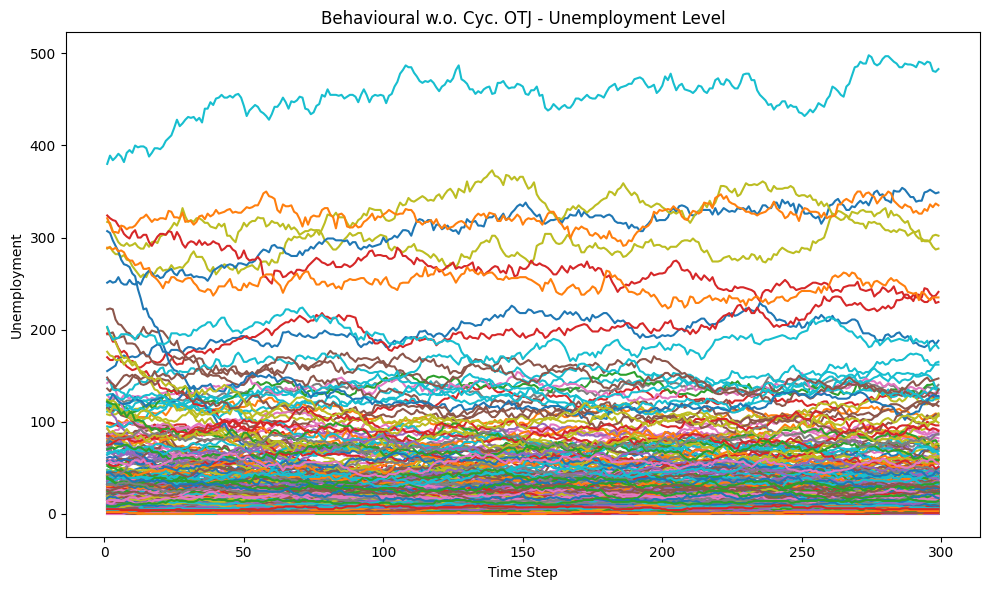

In [23]:
for i, (name, item) in enumerate(filtered_sim_results.items()):

    plt.figure(figsize=(10, 6))
    for occ, group in item.groupby('Occupation'):
        # Use tmp to get real label; fallback to occ if not found
        label = tmp['label'].loc[occ] if occ in tmp.index else f'Occ {occ}'
        plt.plot(group['Time Step'], group['Employment'], label=label)

    plt.xlabel('Time Step')
    plt.ylabel('Unemployment')
    plt.title(f'{name} - Unemployment Level')
    #plt.legend()
    plt.tight_layout()
    plt.show()


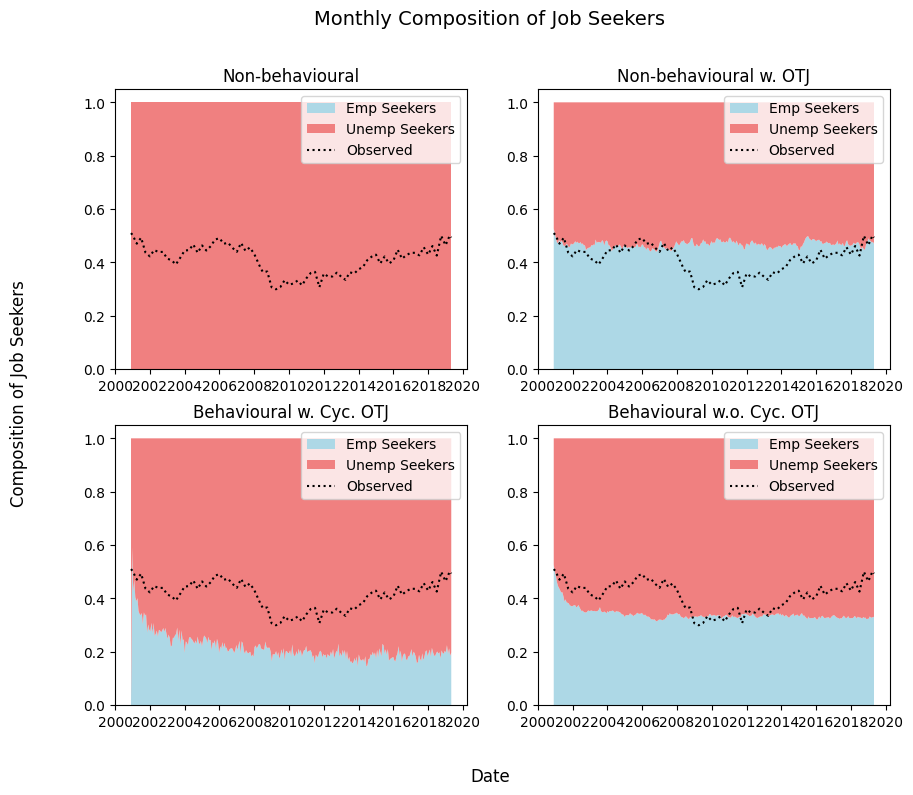

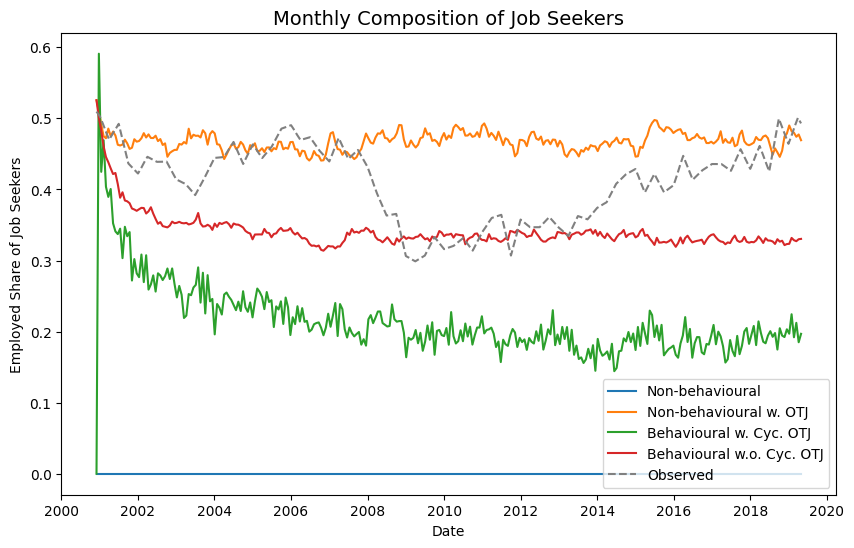

In [24]:

seekers_comp_obs_full = pd.read_csv('../data/behav_params/Eeckhout_Replication/comp_searchers_s_series_abm_validation.csv')

# Map quarters to first day of quarter
quarter_map = {"Q1": "-01-01", "Q2": "-04-01", "Q3": "-07-01", "Q4": "-10-01"}

# Convert quarterly to monthly time series and interpolate missing values

# Replace and convert
seekers_comp_obs_full['DATE'] = (
    seekers_comp_obs_full['date']
    .replace(quarter_map, regex=True)
    .pipe(pd.to_datetime)
)

# Set DATE as index for resampling
seekers_comp_obs_full = seekers_comp_obs_full.set_index('DATE')

# Resample to monthly frequency, keeping the value at the start of each quarter
monthly = seekers_comp_obs_full.resample('MS').asfreq()

# Interpolate missing values linearly
monthly['comp_searchers_s'] = monthly['comp_searchers_s'].interpolate(method='linear')

# Reset index to restore DATE as a column
seekers_comp_obs_full = monthly.reset_index()


seekers_comp_obs = seekers_comp_obs_full[(seekers_comp_obs_full['DATE'] >= calib_date[0]) & (seekers_comp_obs_full['DATE'] <= calib_date[1])]
seekers_comp_obs = seekers_comp_obs.rename(columns={"comp_searchers_s": "Seeker Composition"})
seekers_comp_obs['DATE'] = pd.to_datetime(seekers_comp_obs['DATE'])

plot_seeker_comp(filtered_model_results, seekers_comp_obs, sep=True, share=True,
                 save=save_button , path=output_path)

plot_seeker_comp_line(filtered_model_results, seekers_comp_obs, save=save_button , path=output_path)


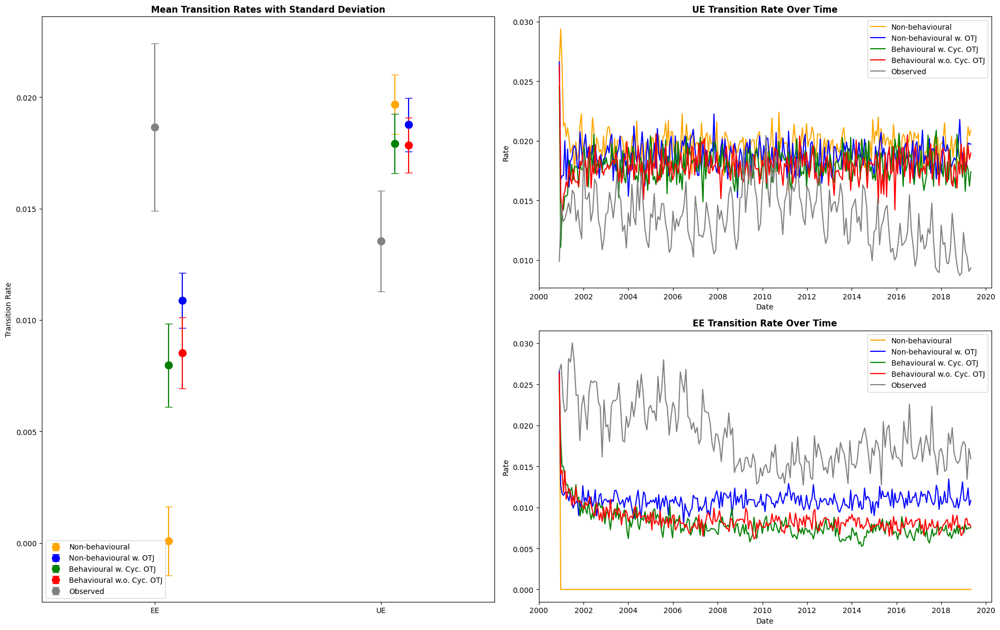

/Users/ebbamark/Documents/Documents - Nuff-Malham/GitHub/transition_abm/calibration_remote/plot_funs.py:225: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  annual_data = res.set_index('DATE').resample(freq).mean()


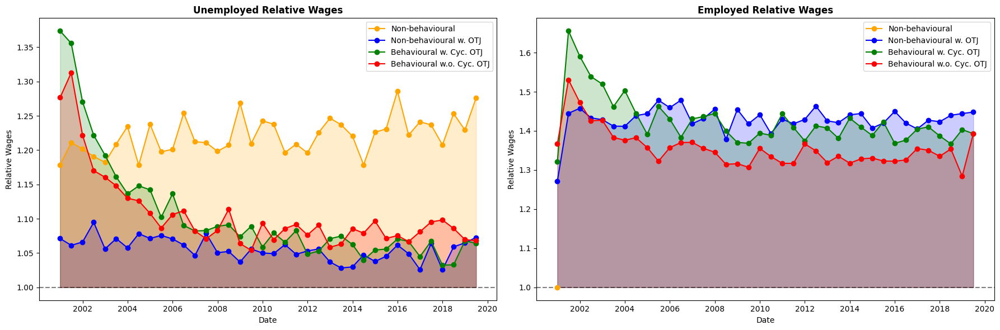

In [25]:

all_rates_new = pd.read_csv('data/transition_rates_96_24.csv')
all_rates_new = all_rates_new[(all_rates_new['date'] >= calib_date[0]) & (all_rates_new['date'] <= calib_date[1])]
all_rates_new['DATE'] = pd.to_datetime(all_rates_new['date'])


plot_trans_rates(filtered_model_results, observation = all_rates_new, save = save_button, path = output_path)
plot_rel_wages(filtered_model_results, save = save_button, path = output_path, freq = '6M')



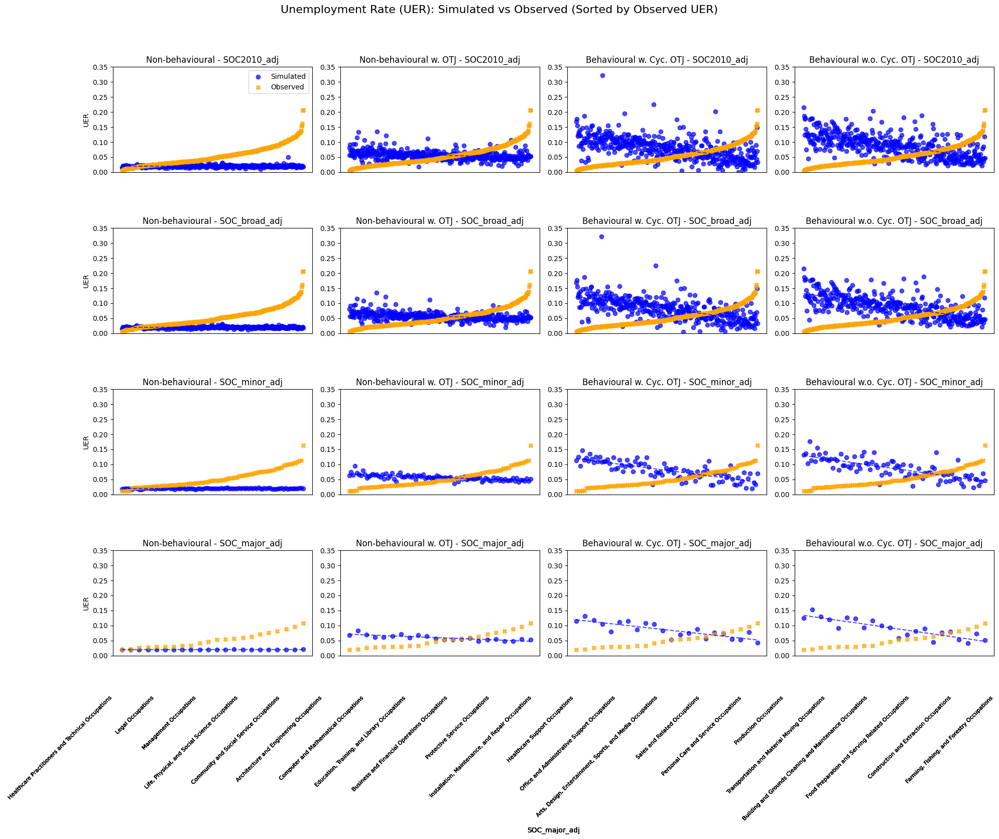

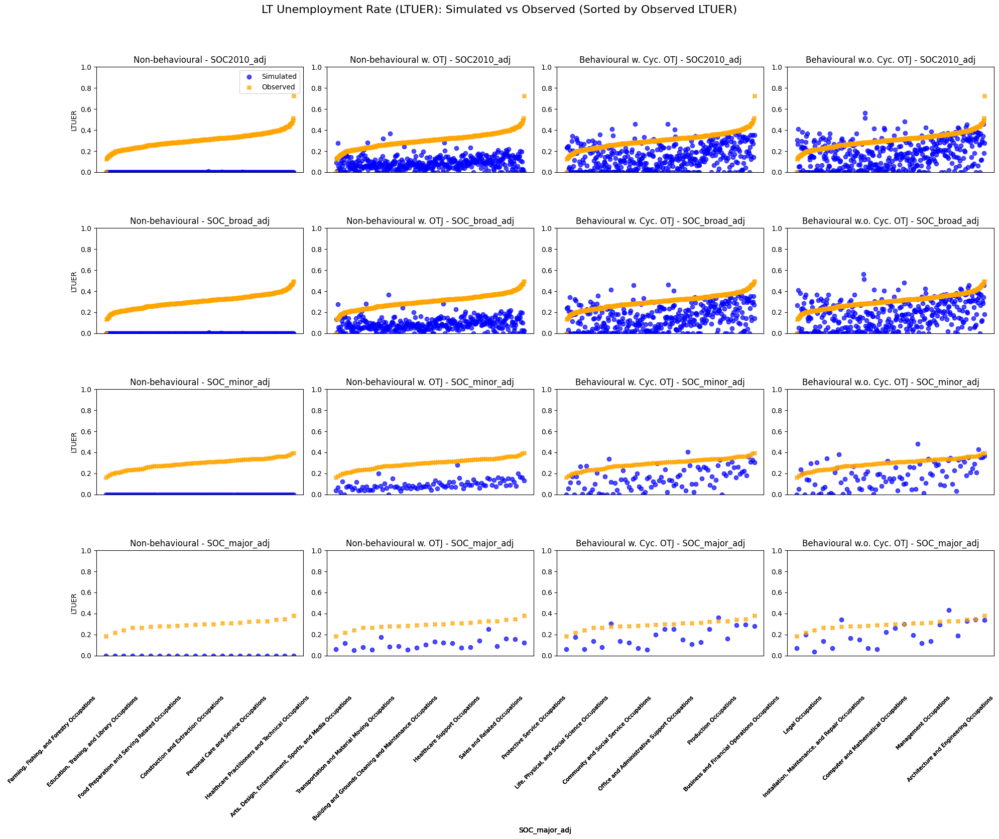

In [26]:
# Example usage:
# occ_ltuers = pd.read_csv(path+"data/highlev_occ_ltuers.csv")
# occ_ltuers = occ_ltuers.groupby('occupation')['ltuer'].mean().reset_index()
# Pasted from data/occ_macro_vars/CPS_LTUER/occ_ltuer_observed.csv
occ_ltuer_obs = pd.read_csv(path + "data/occ_uer_ltuer_observed.csv",
    dtype={
            'SOC_major_adj': str,
            'SOC_minor_adj': str,
            'SOC_broad_adj': str,
            'SOC2010_adj': str,
        }
    )

soc_labs = pd.read_csv('/Users/ebbamark/Documents/Documents - Nuff-Malham/GitHub/transition_abm//data/occ_macro_vars/OEWS/soc_major_labels.csv', dtype={"soc_code": str})


plot_occupation_uer_grid2(filtered_sim_results, occ_ltuer_obs, soc_labs, save=save_button, path=output_path)

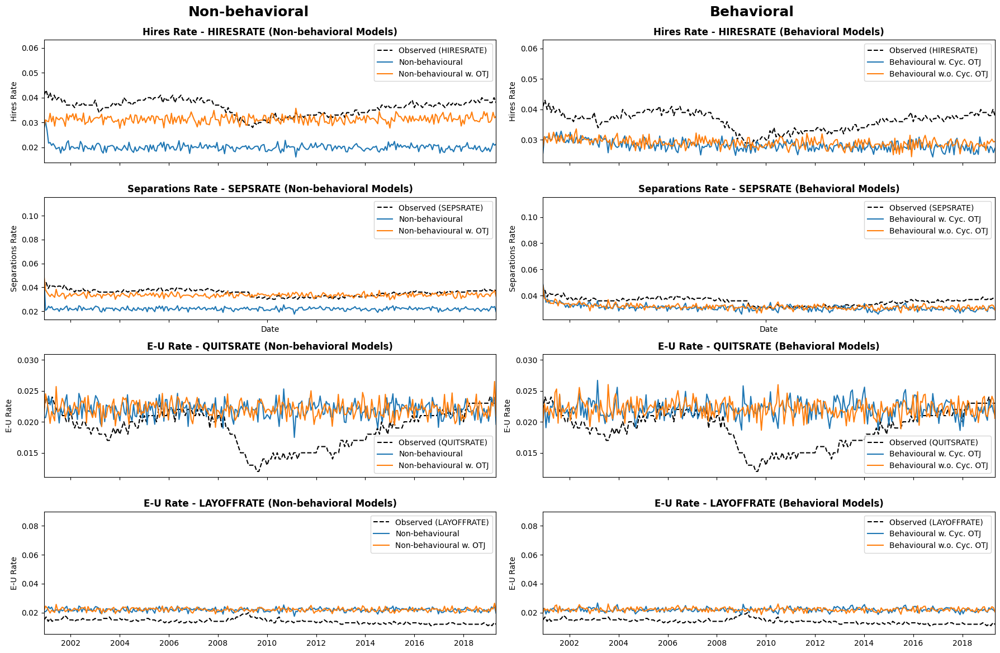

In [27]:

hires_seps_rate(filtered_model_results, jolts = jolts, save = save_button, path = output_path)


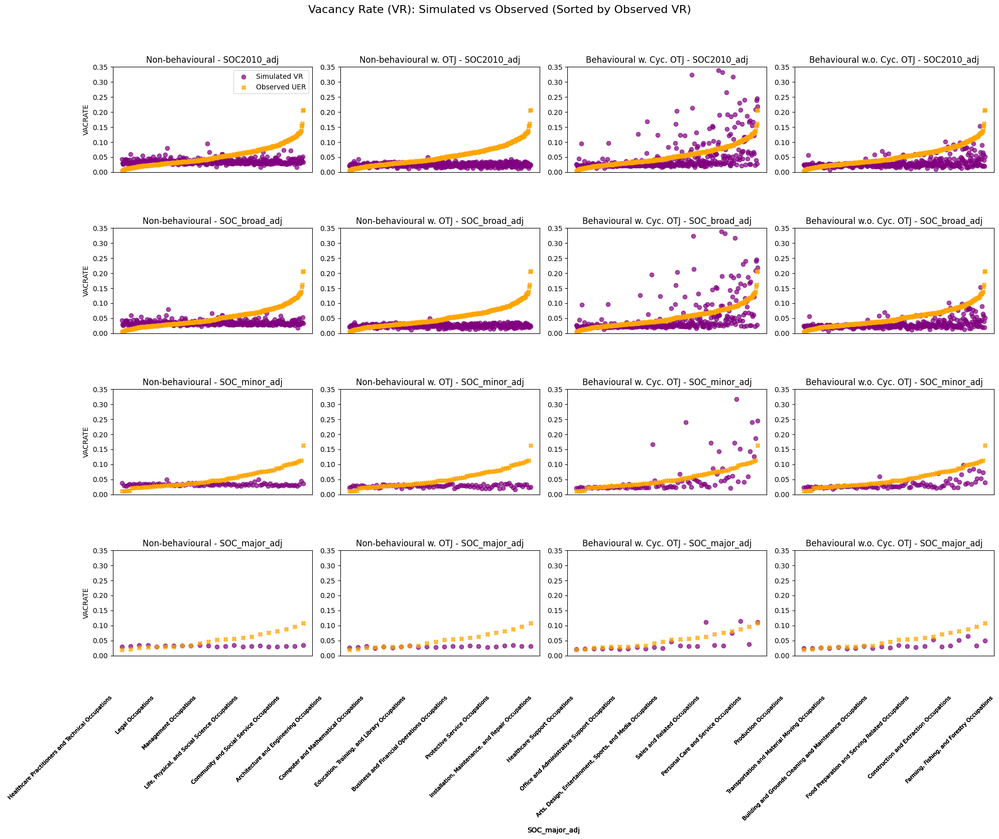

In [28]:
plot_occupation_vr_grid(filtered_sim_results, occ_ltuer_obs, soc_labs, save=save_button, path=output_path)


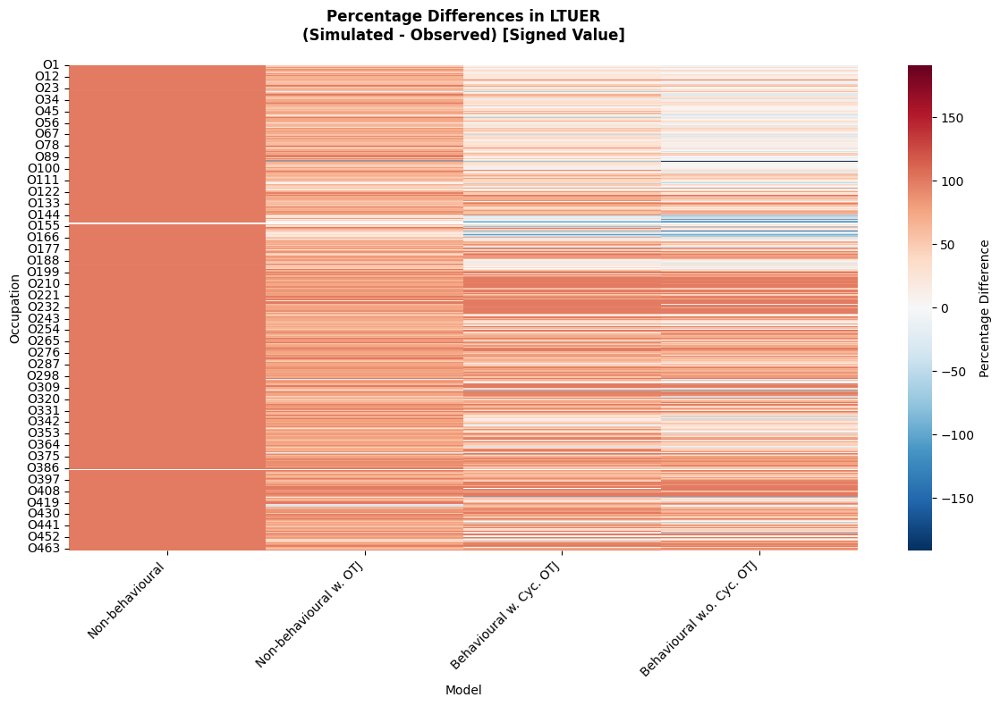

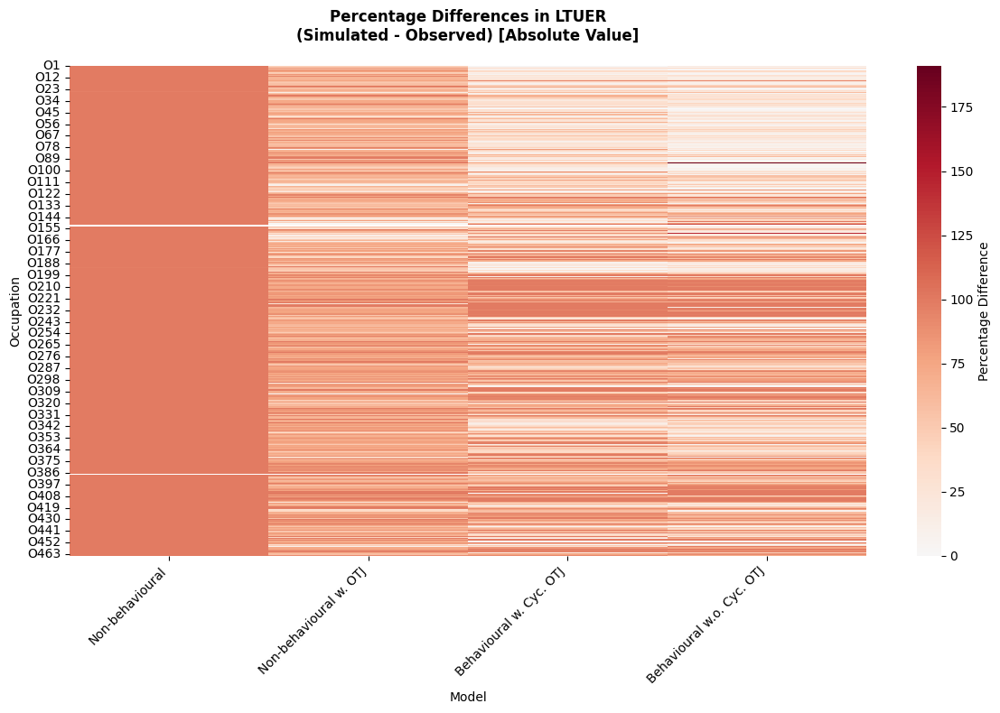

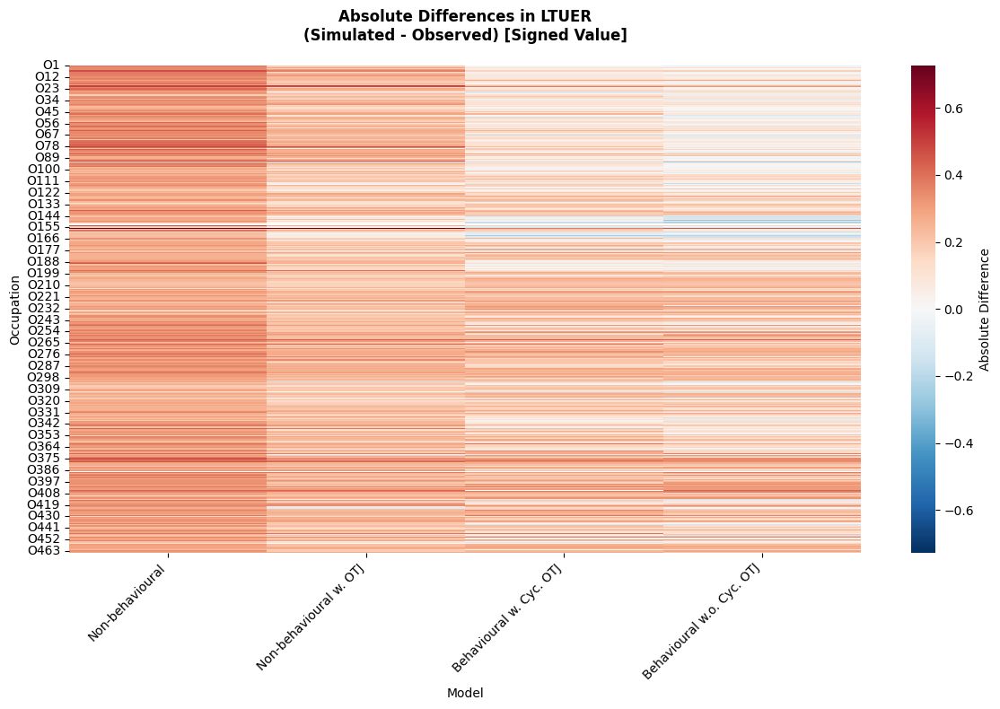

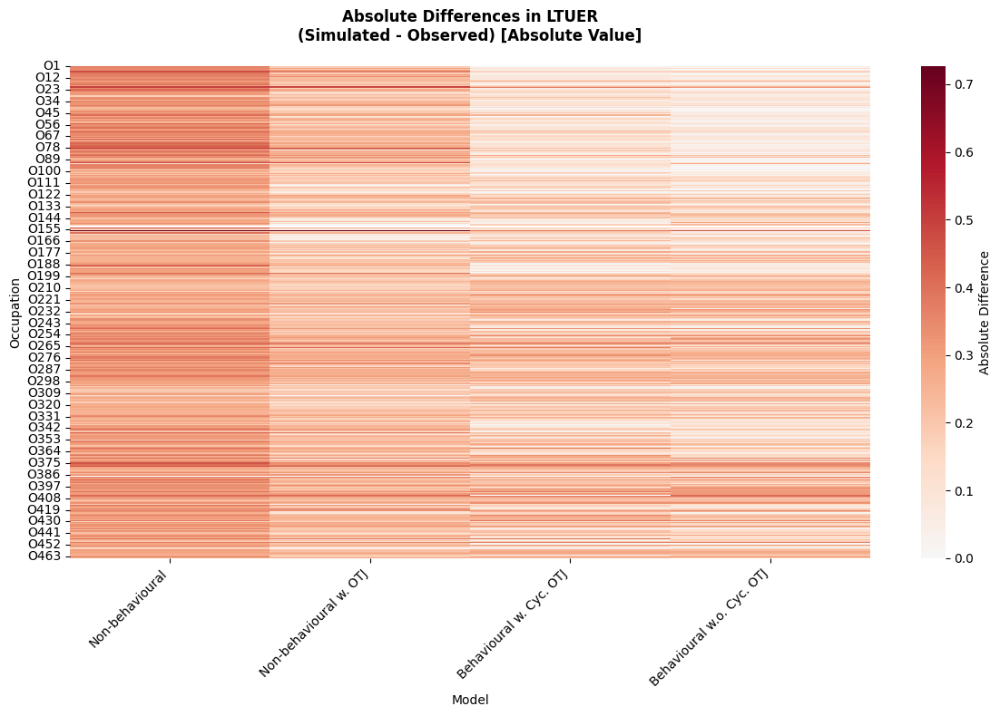

In [29]:
for i in {'absolute', 'percentage'}:
    for j in {True, False}:
         plot_ltuer_difference_heatmap(filtered_sim_results, occ_ltuer_obs, difference_type = i, abs_value = j, save=save_button, path=output_path)

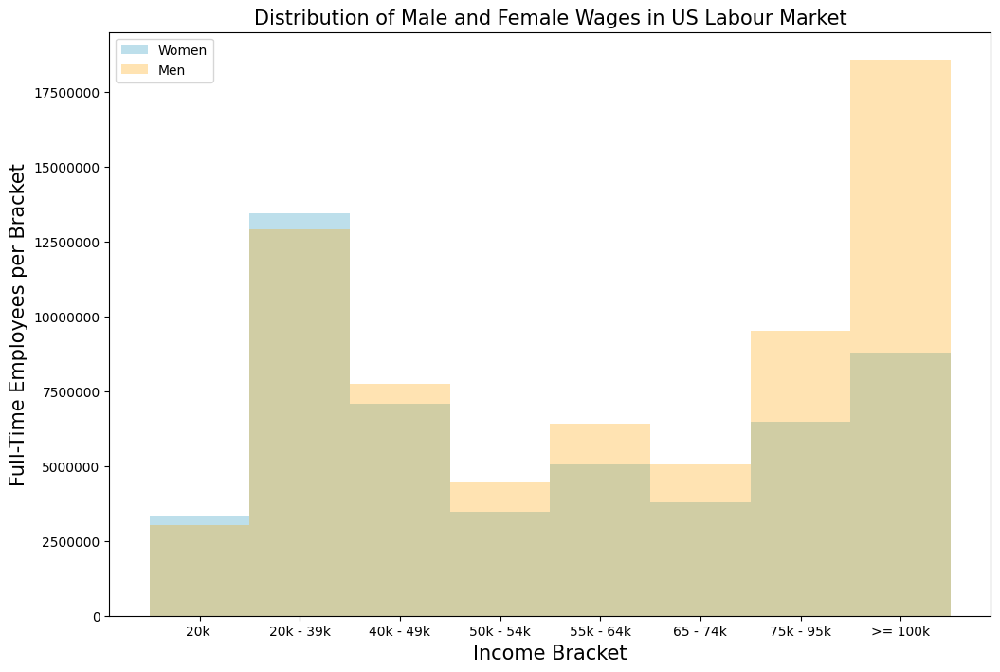

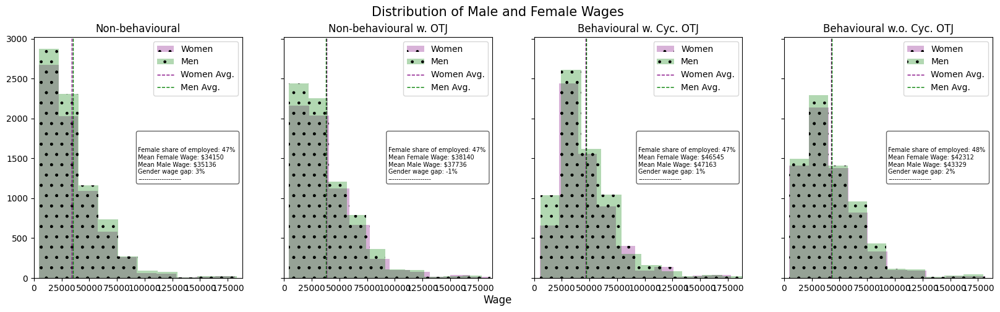

In [30]:

gender_income = pd.read_csv(path+"data/gender_income_distribution_usa_2022.csv", delimiter=',', thousands = ",")

gender_income['Income Bracket'] = gender_income['Income Bracket'].str.replace(' or loss', '')
gender_income['Income Bracket'] = gender_income['Income Bracket'].str.replace(' or more', '')
gender_income['Ceiling'] = gender_income['Income Bracket'].str[-7:]
gender_income['Ceiling'] = gender_income['Ceiling'].str.replace(',', '')
gender_income['Ceiling'] = gender_income['Ceiling'].str.replace('$', '')
gender_income['Ceiling'] = gender_income['Ceiling'].str.replace(' ', '')
gender_income['Ceiling'] = gender_income['Ceiling'].astype('Int64')
gender_income.loc[0:7, 'Bracket'] = "20k "
gender_income.loc[8:12, 'Bracket'] = "20k - 39k"
gender_income.loc[13:14, 'Bracket'] = "40k - 49k"
gender_income.loc[15, 'Bracket'] = "50k - 54k"
gender_income.loc[16, 'Bracket'] = "55k - 64k"
gender_income.loc[17, 'Bracket'] = "65 - 74k"
gender_income.loc[18, 'Bracket'] = "75k - 95k"
gender_income.loc[19, 'Bracket'] = ">= 100k"
brackets = gender_income.groupby(['Bracket']).sum().reset_index()

barWidth = 1
fig = plt.subplots(figsize =(12, 8)) 
br1 = np.arange(len(brackets['Bracket'])) + 1
br2 = br1
 
# Make the plot
plt.bar(br1, brackets['Full-Time Females'], color ='lightblue', width = barWidth, alpha = 0.8,
         label ='Women') 
plt.bar(br2, brackets['Full-Time Males'], color ='orange', width = barWidth, alpha = 0.3,
        label ='Men') 


# Adding Xticks 
plt.xlabel('Income Bracket', fontsize = 15) 
plt.ylabel('Full-Time Employees per Bracket', fontsize = 15) 
plt.ticklabel_format(useOffset=False, style='plain')
plt.xticks([r + barWidth for r in range(len(brackets['Bracket']))], 
        brackets['Bracket'])

plt.title('Distribution of Male and Female Wages in US Labour Market', fontsize = 15) 
plt.legend()
plt.show() 

womens_wage = (gender_income['Ceiling'] * gender_income['Full-Time Females']).sum()/(gender_income['Full-Time Females'].sum())
mens_wage = (gender_income['Ceiling'] * gender_income['Full-Time Males']).sum()/(gender_income['Full-Time Males'].sum())

plot_gender_gaps(filtered_net_results, save = True, path = output_path)


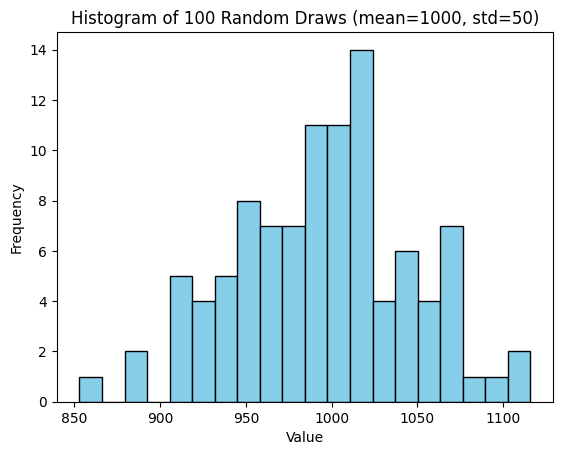

In [31]:


samples = np.random.normal(1000, 0.05*1000, size=100)
plt.hist(samples, bins=20, color='skyblue', edgecolor='black')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title('Histogram of 100 Random Draws (mean=1000, std=50)')
plt.show()

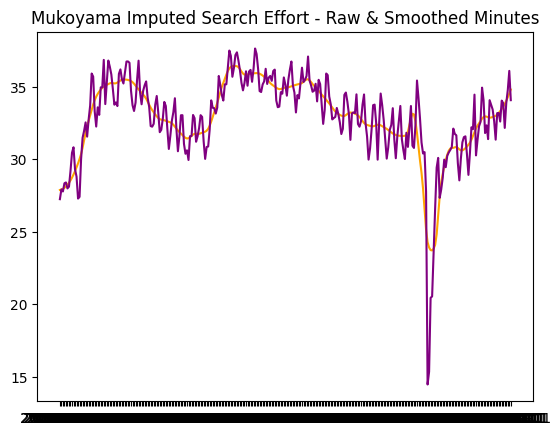

In [32]:
mukoyama_obs_full = pd.read_csv('../data/behav_params/Mukoyama_Replication/monthly_search_ts.csv')
mukoyama_obs_full['DATE'] = mukoyama_obs_full['year'].astype(str) + "-" + mukoyama_obs_full['month'].astype(str).str.zfill(2)  + "-01"

mukoyama_obs = mukoyama_obs_full[(mukoyama_obs_full['DATE'] >= calib_date[0]) & (mukoyama_obs_full['DATE'] <= calib_date[1])]
mukoyama_obs = mukoyama_obs.rename(columns={"value_smooth": "Application Effort (U)"})
mukoyama_obs['DATE'] = pd.to_datetime(mukoyama_obs['DATE'])

plt.plot(mukoyama_obs_full['DATE'], mukoyama_obs_full['value_smooth'], linestyle='-', color='orange', label="Observed Search Effort - Smoothed")
plt.plot(mukoyama_obs_full['DATE'], mukoyama_obs_full['value'], linestyle='-', color='purple', label="Observed Search Effort - Raw")
plt.title("Mukoyama Imputed Search Effort - Raw & Smoothed Minutes")
plt.show()


In [33]:
comp_series = observation
jolts_obs = jolts[(jolts['DATE'] >= calib_date[0]) & (jolts['DATE'] <= calib_date[1])].reset_index()
jolts_obs = jolts_obs.rename(columns={"HIRESRATE": "Hires Rate", "SEPSRATE": "Separations Rate"})
all_rates_new = all_rates_new.rename(columns={"UE": "UE_Trans_Rate", "EE": "EE_Trans_Rate"})
comp_series = comp_series.merge(jolts_obs, on='DATE', how='left')
comp_series = comp_series.merge(all_rates_new, on = 'DATE')
comp_series = comp_series.merge(mukoyama_obs, on = 'DATE')
comp_series = comp_series.merge(seekers_comp_obs, on = 'DATE', how = 'left')

def compute_time_series_metrics(res_dict, seekers_info_dict, obs_dict, variables):
    rows = []
    for model_name, sim_df in res_dict.items():
        for var in variables:
            if var == "Application Effort (U)":
                sim_series = seekers_info_dict[model_name][var].values if var in seekers_info_dict[model_name] else None
            else:
                sim_series = sim_df[var].values if var in sim_df else None
            obs_series = obs_dict[var].values if var in obs_dict else None
            if sim_series is None or obs_series is None or len(sim_series) != len(obs_series):
                #continue
                raise KeyError(f"Missing or mismatched data for {var} in {model_name}")
            if var == "Application Effort (U)":
                # Only keep correlation
                row = {
                    'Model': model_name,
                    'Variable': var,
                    'Correlation': round(float(np.corrcoef(sim_series, obs_series)[0, 1]), 3)
                }
            else:
                # Full set of metrics
                row = {
                    'Model': model_name,
                    'Variable': var,
                    'Mean (Sim)': round(float(np.mean(sim_series)), 3),
                    'Mean (Obs)': round(float(np.mean(obs_series)), 3),
                    #'Variance (Sim)': round(float(np.var(sim_series)), 3),
                    #'Variance (Obs)': round(float(np.var(obs_series)), 3),
                    'SSE': round(float(np.sum((sim_series - obs_series) ** 2)), 3),
                    'Correlation': round(float(np.corrcoef(sim_series, obs_series)[0, 1]), 3)
                }

            rows.append(row)
    return pd.DataFrame(rows)

BEST_COLOR = "yellow!25"

def _fmt_num(x):
    return "--" if pd.isna(x) else f"{x:.3f}"

def _color_val(x, color=BEST_COLOR):
    return "--" if pd.isna(x) else f"\\cellcolor{{{color}}}{x:.3f}"

def highlight_best(df: pd.DataFrame) -> pd.DataFrame:
    df = df.copy()

    # columns we may format
    metric_cols = [
        "Mean (Sim)", "Mean (Obs)",
        "Variance (Sim)", "Variance (Obs)",
        "SSE", "Correlation"
    ]

    # format all numeric cells first (as strings)
    for c in df.columns:
        if c in metric_cols:
            df[c] = df[c].apply(_fmt_num)

    # now compute winners per Variable and recolor the corresponding *Sim/SSE/Corr* cell
    for var in df["Variable"].unique():
        sub = df[df["Variable"] == var]

        # Mean difference -> color Mean (Sim) with smallest |Mean(Sim)-Mean(Obs)|
        if {"Mean (Sim)", "Mean (Obs)"}.issubset(sub.columns):
            mean_sim = pd.to_numeric(sub["Mean (Sim)"].replace("--", np.nan))
            mean_obs = pd.to_numeric(sub["Mean (Obs)"].replace("--", np.nan))
            diffs = (mean_sim - mean_obs).abs().dropna()
            if not diffs.empty:
                idx = diffs.idxmin()
                raw_val = mean_sim.loc[idx]
                df.loc[idx, "Mean (Sim)"] = _color_val(raw_val)

        # Variance difference -> color Variance (Sim)
        if {"Variance (Sim)", "Variance (Obs)"}.issubset(sub.columns):
            var_sim = pd.to_numeric(sub["Variance (Sim)"].replace("--", np.nan))
            var_obs = pd.to_numeric(sub["Variance (Obs)"].replace("--", np.nan))
            diffs = (var_sim - var_obs).abs().dropna()
            if not diffs.empty:
                idx = diffs.idxmin()
                raw_val = var_sim.loc[idx]
                df.loc[idx, "Variance (Sim)"] = _color_val(raw_val)

        # SSE -> lowest wins
        if "SSE" in sub.columns:
            sse = pd.to_numeric(sub["SSE"].replace("--", np.nan)).dropna()
            if not sse.empty:
                idx = sse.idxmin()
                raw_val = float(sse.loc[idx])
                df.loc[idx, "SSE"] = _color_val(raw_val)

        # Correlation -> highest wins
        if "Correlation" in sub.columns:
            corr = pd.to_numeric(sub["Correlation"].replace("--", np.nan)).dropna()
            if not corr.empty:
                idx = corr.idxmax()
                raw_val = float(corr.loc[idx])
                df.loc[idx, "Correlation"] = _color_val(raw_val)

    return df


# ---- use it ----
ts_table = compute_time_series_metrics(
    filtered_model_results, seekers_recs, comp_series,
    ['VACRATE','UER','LTUER',"Hires Rate","Separations Rate",
     'UE_Trans_Rate','EE_Trans_Rate','Application Effort (U)','Seeker Composition']
)

highlighted = highlight_best(ts_table)

# save_button = True

if save_button:
    latex_table = highlighted.to_latex(
        index=False,
        escape=False,                 # <-- required so \cellcolor works
        longtable=False,
        float_format="%.3f"
    )
    with open(f'{output_path}ts_metrics_table.tex', "w") as f:
        f.write("\\begin{table}[ht]\n")
        f.write("\\centering\n")
        f.write("\\begin{adjustbox}{width=\\textwidth}\n")
        f.write(latex_table)
        f.write("\\end{adjustbox}\n")
        f.write("\\end{table}\n")

    print(f"LaTeX table saved to {output_path}ts_metrics_table.tex")



KeyError: 'Missing or mismatched data for VACRATE in Non-behavioural'

In [ ]:
filtered_sim_results['Behavioural w. Cyc. OTJ']
print(mod_data['separation_rates'])


0      0.032013
1      0.055769
2      0.068674
3      0.068674
4      0.068674
         ...   
459    0.191653
460    0.294911
461    0.112268
462    0.203695
463    0.180711
Name: seps_rate, Length: 464, dtype: float64


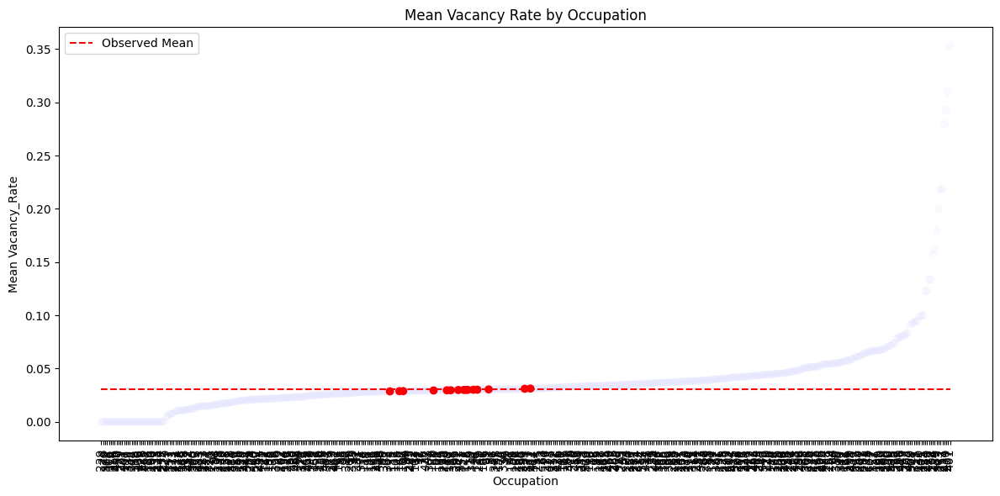

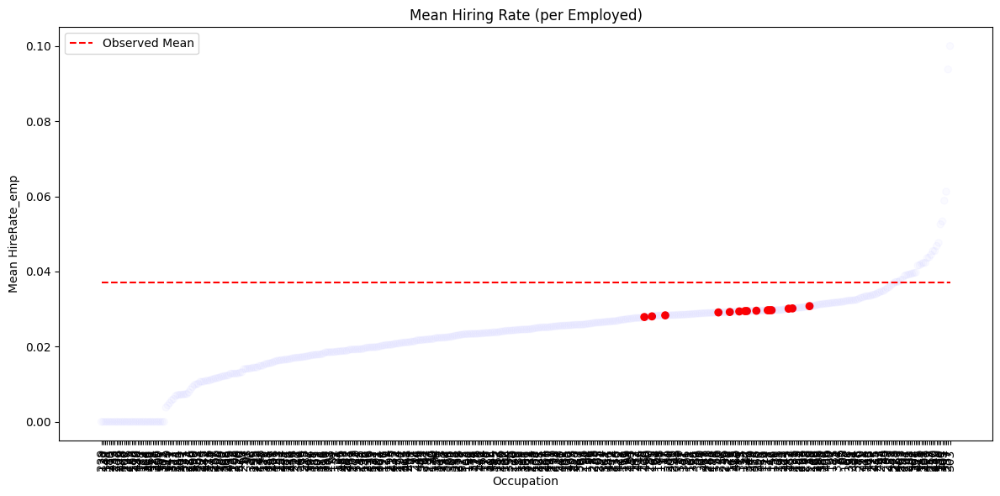

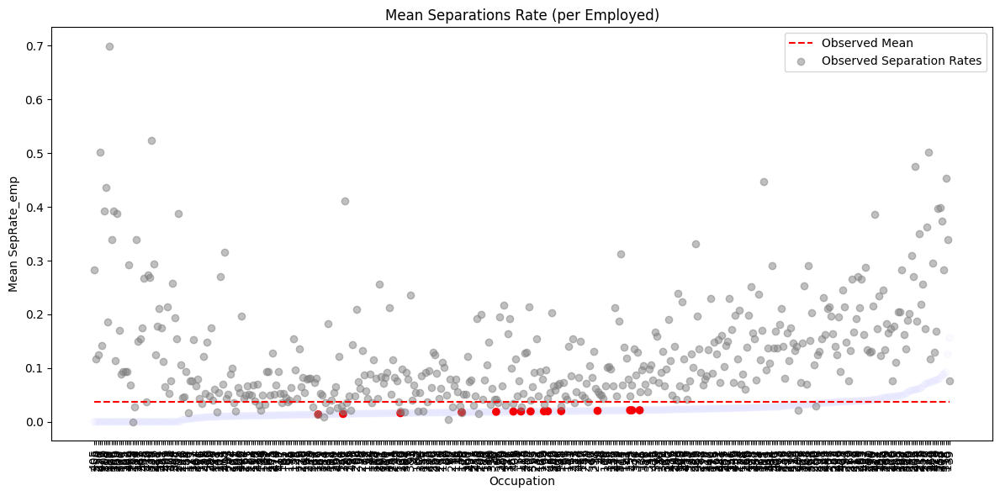

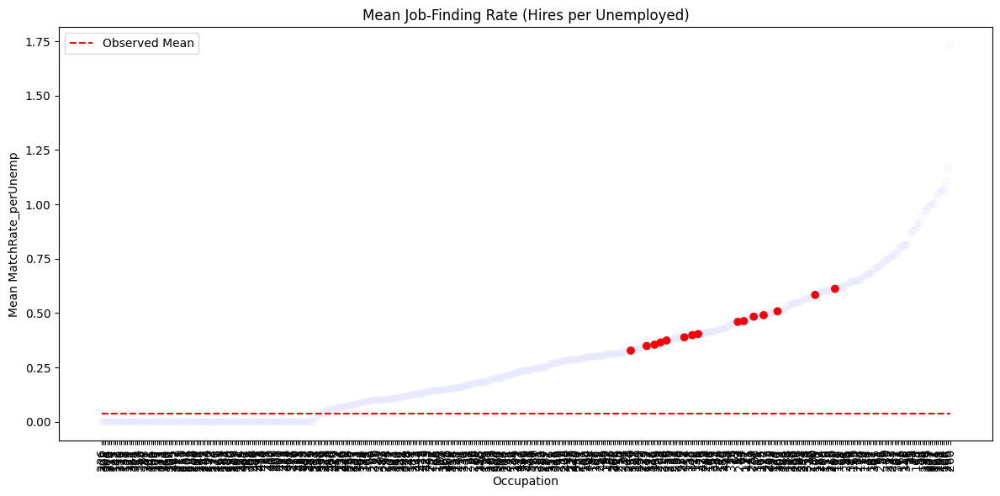

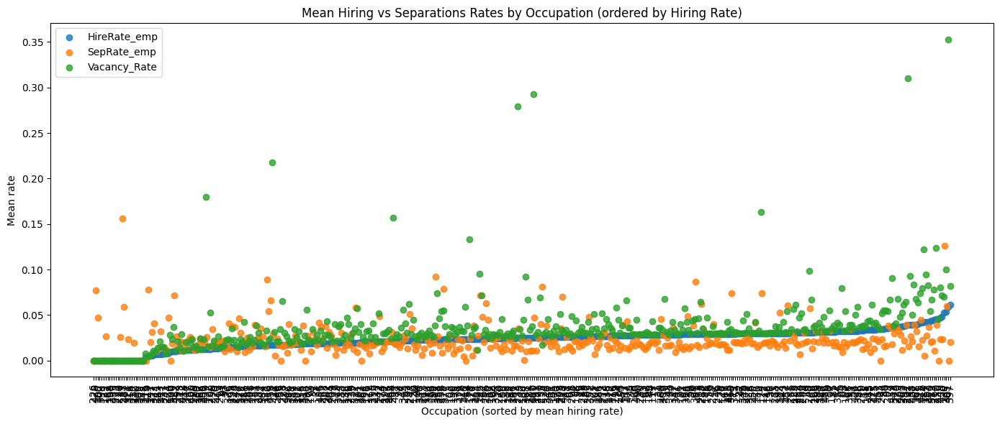

In [ ]:

# ========= Helpers =========
def _build_occ_metrics_from_record_df(record_df: pd.DataFrame) -> pd.DataFrame:
    """Create per-time, per-occupation metrics from record_df, then average over time."""
    df = record_df.copy()

    # Safe denominators
    emp   = df['Employment'].replace(0, np.nan)
    unemp = df['Unemployment'].replace(0, np.nan)

    # Per-time-step rates (per occupation)
    df['HireRate_emp']        = df['Hires'] / emp
    df['SepRate_emp']         = df['Separations'] / emp
    df['MatchRate_perUnemp']  = df['Hires'] / unemp  # job-finding rate
    df['Vacancy_Rate']  = df['Vacancies'] / emp  # vacancy rate

    # Application effort proxies already logged in record_df
    df['UnempSeekers'] = df['Unemployed Seekers']
    df['EmpSeekers']   = df['Employed Seekers']

    # Mean over the whole simulation by occupation (ignoring NaNs)
    metrics = [
        'UnempSeekers',
        'EmpSeekers',
        'Vacancies',
        'Vacancy_Rate',
        'HireRate_emp',
        'SepRate_emp',
        'MatchRate_perUnemp',
    ]
    keep = ['Occupation'] + metrics
    mean_occ = df[keep].groupby('Occupation', as_index=True).mean(numeric_only=True)

    if mod_data is not None and 'separation_rates' in mod_data:
        sep_rates = mod_data['separation_rates']
        # If sep_rates is a dict: convert to Series/DataFrame
        if isinstance(sep_rates, dict):
            sep_rates = pd.Series(sep_rates, name='SeparationRate_exog')
        # If sep_rates is already a Series, ensure name
        if isinstance(sep_rates, pd.Series):
            if sep_rates.name is None:
                sep_rates.name = 'SeparationRate_exog'
            sep_rates.index = sep_rates.index.astype(mean_occ.index.dtype)
            mean_occ = mean_occ.merge(sep_rates, left_index=True, right_index=True, how='left')
        # If sep_rates is a DataFrame, assume it has 'Occupation' column
        elif isinstance(sep_rates, pd.DataFrame):
            mean_occ = mean_occ.merge(
                sep_rates.rename(columns={sep_rates.columns[0]: 'SeparationRate_exog'}),
                left_index=True, right_on='Occupation', how='left'
            ).set_index('Occupation')

    return mean_occ

def _build_econ_means_from_grouped(grouped: pd.DataFrame) -> pd.Series:
    """If record_df not available, make economy-wide means over time from grouped."""
    g = grouped.copy()
    # These rates already exist in your code; recompute defensively if absent.
    if 'Hires Rate' not in g.columns:
        g['Hires Rate'] = g['Hires'] / g['Employment'].replace(0, np.nan)
    if 'Separations Rate' not in g.columns:
        g['Separations Rate'] = g['Separations'] / g['Employment'].replace(0, np.nan)
    # Job-finding rate (hires per unemployed)
    if 'MatchRate_perUnemp' not in g.columns:
        g['MatchRate_perUnemp'] = g['Hires'] / g['Unemployment'].replace(0, np.nan)

    # Application effort proxies at economy level (sum across occupations already in grouped)
    rename_map = {'Unemployed Seekers': 'UnempSeekers', 'Employed Seekers': 'EmpSeekers'}
    g = g.rename(columns=rename_map)

    econ_means = pd.Series({
        'UnempSeekers':       g['UnempSeekers'].mean(skipna=True) if 'UnempSeekers' in g else np.nan,
        'EmpSeekers':         g['EmpSeekers'].mean(skipna=True) if 'EmpSeekers' in g else np.nan,
        'Vacancies':          g['Vacancies'].mean(skipna=True) if 'Vacancies' in g else np.nan,
        'HireRate_emp':       g['Hires Rate'].mean(skipna=True),
        'SepRate_emp':        g['Separations Rate'].mean(skipna=True),
        'MatchRate_perUnemp': g['MatchRate_perUnemp'].mean(skipna=True),
    })
    return econ_means

def plot_metric_mean_by_occ(mean_df: pd.DataFrame, metric: str, sort_by_value=True, obs_mean= None, topk=None, title=None):
    """Scatter: one point per occupation, y = mean over time of chosen metric."""
    df = mean_df[[metric]].dropna().copy()
    if metric == "SepRate_emp":
        df = mean_df[[metric, 'seps_rate']].dropna().copy()
    if df.empty:
        print(f"No data to plot for metric '{metric}'.")
        return

    if sort_by_value:
        df = df.sort_values(metric, ascending=True)

    if isinstance(topk, int):
        df = df.nlargest(topk, metric)

    plt.figure(figsize=(12, 6))
    xs = np.arange(len(df))
    colors = ['red' if occ in trending_occs else 'blue' for occ in df.index]
    alphs = [1 if occ in trending_occs else 0.02 for occ in df.index]
    plt.scatter(xs, df[metric], c=colors, alpha=alphs)

    if obs_mean is not None:
        plt.plot(range(len(xs)), [obs_mean]*len(xs), color='red', linestyle='--', label='Observed Mean')
    if metric == "SepRate_emp":
        plt.scatter(range(len(xs)), df['seps_rate'], color='grey', alpha = 0.5, label='Observed Separation Rates')

    plt.xticks(xs, df.index.astype(str), rotation=90)
    plt.xlabel('Occupation')
    plt.ylabel(f"Mean {metric}")
    plt.title(title if title else f"Mean {metric} across simulation")
    plt.legend()
    plt.tight_layout()
    plt.show()

def plot_hire_sep_ordered(mean_df: pd.DataFrame, topk=None, ascending=True):
    """
    One plot with BOTH mean hiring and separations rates per occupation,
    ordered by mean hiring rate.
    """
    df = mean_df[['HireRate_emp', 'SepRate_emp', 'MatchRate_perUnemp', 'Vacancy_Rate']].dropna().copy()
    if df.empty:
        print("No data to plot for HireRate_emp / SepRate_emp.")
        return

    # Order by hiring rate
    df = df.sort_values('HireRate_emp', ascending=ascending)

    # Optionally keep only the top-k by hiring rate (after sorting)
    if isinstance(topk, int):
        df = df.tail(topk) if ascending else df.head(topk)

    xs = np.arange(len(df))
    # small horizontal offsets to avoid perfect overlap
    offset = 0.15

    plt.figure(figsize=(14, 6))
    plt.scatter(xs - offset, df['HireRate_emp'], alpha=0.8, label='HireRate_emp')
    #plt.scatter(xs - offset, df['MatchRate_perUnemp'], alpha=0.8, label='MatchRate_perUnemp')
    plt.scatter(xs + offset, df['SepRate_emp'],  alpha=0.8, label='SepRate_emp')
    plt.scatter(xs - offset, df['Vacancy_Rate'], alpha=0.8, label='Vacancy_Rate')


    plt.xticks(xs, df.index.astype(str), rotation=90)
    plt.xlabel('Occupation (sorted by mean hiring rate)')
    plt.ylabel('Mean rate')
    plt.title('Mean Hiring vs Separations Rates by Occupation (ordered by Hiring Rate)')
    plt.legend()
    plt.tight_layout()
    plt.show()

# ========= Use whichever output you have =========
# After your model run, you typically have:
# record_df, grouped, net, data, seekers_rec, avg_wage_offer_diff_df = run_single_local(...)

# Build per-occupation means (this is what you want for one point per occupation)
mean_occ = _build_occ_metrics_from_record_df(filtered_sim_results['Behavioural w. Cyc. OTJ'])  # or any other model's record_df
# Plot: one dot per occupation (mean over time)
#plot_metric_mean_by_occ(mean_occ, 'UnempSeekers',       sort_by_value=True, topk=None, title='Mean Unemployed Seekers by Occupation')
#plot_metric_mean_by_occ(mean_occ, 'EmpSeekers',         sort_by_value=True, topk=None, title='Mean Employed Seekers (OTJ) by Occupation')
plot_metric_mean_by_occ(mean_occ, 'Vacancy_Rate',        sort_by_value=True, obs_mean=observation['VACRATE'].mean(), topk=None, title='Mean Vacancy Rate by Occupation')
plot_metric_mean_by_occ(mean_occ, 'HireRate_emp',       sort_by_value=True, obs_mean = jolts['HIRESRATE'].mean(), topk=None, title='Mean Hiring Rate (per Employed)')
plot_metric_mean_by_occ(mean_occ, 'SepRate_emp',        sort_by_value=True, obs_mean = jolts['SEPSRATE'].mean(), topk=None, title='Mean Separations Rate (per Employed)')
plot_metric_mean_by_occ(mean_occ, 'MatchRate_perUnemp', sort_by_value=True, obs_mean = jolts['HIRESRATE'].mean(),topk=None, title='Mean Job-Finding Rate (Hires per Unemployed)')

# NEW: both rates on the same plot, ordered by mean hiring rate
plot_hire_sep_ordered(mean_occ, topk=None, ascending=True)  # set topk=50 to show the 50 lowest/highest by hiring rate


In [ ]:
# # ---------------- Best Parameters ----------------
# model_cats = ["otj_disc", "otj_cyclical_e_disc", "nonbehav", "otj_nonbehav"]
# for model_cat in model_cats:
#     import matplotlib.gridspec as gridspec

#     grid_results = pd.read_csv(f'{path}output/grid_search_results_{model_cat}.csv')
#     # Filter rows where 'timestamp' > '2025-09-05'
#     grid_results = grid_results.sort_values(by='distance', ascending=True).reset_index(drop=True)
#     print(len(grid_results))
#     if model_cat in ["otj_disc", "otj_cyclical_e_disc"]:
#             grid_results = grid_results[grid_results['timestamp'] > '2025-09-05']
#             print(len(grid_results))
#     best_d_u, best_gamma_u, best_dist = grid_results['d_u'].iloc[0], grid_results['gamma_u'].iloc[0], grid_results['distance'].iloc[0]
#     print(f" Best parameters for {model_cat}: d_u={best_d_u:.4f}, gamma_u={best_gamma_u:.4f}, distance={best_dist:.4f}")

#     setting = calib_list[model_cat]
#     grid_params = {**params, **setting}
#     best_params = grid_params.copy()
#     best_params.update({"d_u": best_d_u, "gamma_u": best_gamma_u, 'simple_res': True})
#     model_output = run_single_local(**best_params)
#     date_range = pd.date_range(start=observation["DATE"].iloc[0], end=observation["DATE"].iloc[-1], periods=len(model_output['UER']))

#     # Create a figure with 2 rows using gridspec
#     fig = plt.figure(figsize=(8, 12))
#     gs = gridspec.GridSpec(3, 1, height_ratios=[1, 1, 1.5])

#     # First plot: Best-Fit Time Series
#     ax1 = fig.add_subplot(gs[0])
#     ax1.plot(observation['DATE'], observation["UER"], label="Observed UER", color="black", linewidth=2)
#     ax1.plot(date_range, model_output["UER"], label="Model UER", color="green", linestyle="--")
#     ax1.set_title(f"Best-Fit UER — {model_cat}")
#     ax1.set_ylabel("UER")
#     ax1.legend()
#     ax1.grid(True)

#     ax2 = fig.add_subplot(gs[1])
#     ax2.plot(observation['DATE'], observation["VACRATE"], label="Observed VACRATE", color="black", linewidth=2, alpha=0.5)
#     ax2.plot(date_range, model_output["VACRATE"], label="Model VACRATE", color="blue", linestyle="--", alpha=0.5)
#     ax2.set_ylabel("VACRATE")
#     ax2.legend(loc="lower right")
#     ax2.grid(True)

#     # Second plot: Heatmap
#     ax3 = fig.add_subplot(gs[2])
#     heatmap_data = grid_results.pivot_table(index='d_u', columns='gamma_u', values='distance')
#     sns.heatmap(
#         heatmap_data,
#         cmap='viridis',
#         annot=False,
#         cbar_kws={'label': 'Distance'},
#         xticklabels=[f"{x:.3f}" for x in heatmap_data.columns],
#         yticklabels=[f"{y:.3f}" for y in heatmap_data.index],
#         ax=ax3
#     )
#     ax3.set_xlabel('gamma_u')
#     ax3.set_ylabel('d_u')
#     ax3.set_title(f'Grid Search Results Heatmap — {model_cat}')

#     plt.tight_layout()
#     #plt.show()
#     plt.savefig(os.path.expanduser(path + f"output/best_fit_and_heatmap_{model_cat}.png"))
#     plt.close(fig)

In [ ]:
print(mean_occ[mean_occ['Vacancy_Rate'].isna()])
print(mean_occ[mean_occ['SepRate_emp'].isna()])
print(mean_occ[mean_occ['HireRate_emp'].isna()])
print(mean_occ[mean_occ['MatchRate_perUnemp'].isna()])

dead_occs = mean_occ[mean_occ['MatchRate_perUnemp'].isna()].index.tolist()
tmp = pd.read_csv(path + "dRC_Replication/data/ipums_variables.csv")

# tmp[tmp.index.isin(dead_occs)]


# occuptions that have reservation wages that are too high at least 15% of the time
rw_probs = [149,
0,
  112,
    6,
   66,
  436,
  187,
  437,
  59,
  413,
  17,
  47,
  162,
  188,
  148,
  3,
  189]

rw_probs_2 = [149,
               0,
               112,
               6,
               66,
               187,
               436,
               188,
               17,
               59,
               285,
               47,
               252,
               3,
               413,
               71,
               160,
               77,
               148,
               1,
               246]

tmp[tmp.index.isin(rw_probs)]

# test = filtered_sim_results['Behavioural w. Cyc. OTJ']
# # test = test[test['Occupation'].isin(dead_occs)]
# # Plot Employment by Time Step for each occupation group
# for occ, group in test.groupby('Occupation'):
#     plt.plot(group['Time Step'], group['Unemployment'], label=f'Occ {occ}')
# plt.xlabel('Time Step')
# plt.ylabel('Unemployment')
# plt.title('Unemployment by Time Step for Each Occupation')
# #plt.legend(ncol=2, fontsize='small', bbox_to_anchor=(1.05, 1), loc='upper left')
# plt.show()


            UnempSeekers  EmpSeekers  Vacancies  Vacancy_Rate  HireRate_emp  \
Occupation                                                                    
28            933.445946  523.495495        0.0           NaN           NaN   
55            933.445946  523.495495        0.0           NaN           NaN   
151           933.445946  523.495495        0.0           NaN           NaN   
155           933.445946  523.495495        0.0           NaN           NaN   
163           933.445946  523.495495        0.0           NaN           NaN   
193           933.445946  523.495495        0.0           NaN           NaN   
300           933.445946  523.495495        0.0           NaN           NaN   
307           933.445946  523.495495        0.0           NaN           NaN   
324           933.445946  523.495495        0.0           NaN           NaN   
338           933.445946  523.495495        0.0           NaN           NaN   
345           933.445946  523.495495        0.0     

,label,id,Interval,classification,acs_occ_code,median_edu,median_earnings,total_employment_2010,log_median_earnings,log_total_employment_2010,auto_prob_average
0,chief executives and legislators,0,NaN,"Management, business, and financial",10,9.080371,117268.13,13052,11.672218,9.476697,0.01500
3,marketing and sales managers,3,NaN,"Management, business, and financial",50,9.026223,76888.64,9648,11.250113,9.174506,0.01350
6,computer and information systems managers,6,NaN,"Management, business, and financial",110,9.379449,87511.14,5732,11.379521,8.653820,0.03500
17,architectural and engineering managers,17,NaN,"Management, business, and financial",300,9.880886,109816.88,1805,11.606570,7.498316,0.01700
47,financial analysts,47,NaN,"Management, business, and financial",840,9.914438,97502.34,935,11.487632,6.840547,0.23000
59,"software developers, applications and systems ...",59,NaN,"Computer, engineering, and science",1020,9.795245,81013.96,9338,11.302377,9.141847,0.08600
66,actuaries,66,NaN,"Computer, engineering, and science",1200,10.285714,119131.71,287,11.687985,5.659482,0.21000
112,"lawyers, and judges, magistrates, and other ju...",112,NaN,Legal,2100,10.898983,107548.76,12394,11.585700,9.424968,0.28375
148,pharmacists,148,NaN,Healthcare practitioners and technical,3050,10.368301,85751.44,3079,11.359208,8.032360,0.01200
149,physicians and surgeons,149,NaN,Healthcare practitioners and technical,3060,10.958114,164028.34,9669,12.007794,9.176680,0.00000


In [ ]:
for name in ["Behavioural w. Cyc. OTJ", "Behavioural w.o. Cyc. OTJ"]: # "Non-behavioural", "Non-behavioural w. OTJ",
    print(name)
    temp = filtered_net_results[name]
    for occ in temp:
        t_unemp = []
        long_unemps = []
        t_unemp.extend([wrkr.time_unemployed for wrkr in occ.list_of_unemployed])
        long_unemps.extend(wrkr for wrkr in occ.list_of_unemployed if wrkr.time_unemployed > 20)
        t_unemp.sort(reverse = True)
        if len(t_unemp) > 0 and any(t > 20 for t in t_unemp):
            print(tmp[tmp.index == occ.occupation_id]['label'].values)
            print(t_unemp)


Behavioural w. Cyc. OTJ
['chief executives and legislators']
[45, 15, 14, 14, 13, 12, 12, 12, 11, 11, 11, 11, 10, 10, 10, 10, 10, 9, 9, 9, 8, 8, 8, 8, 8, 8, 8, 8, 8, 7, 7, 7, 7, 7, 7, 7, 6, 6, 6, 6, 6, 6, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
['computer and information systems managers']
[22, 12, 10, 7, 7, 6, 6, 6, 6, 6, 5, 5, 5, 5, 5, 4, 4, 4, 4, 4, 4, 4, 4, 3, 3, 3, 3, 3, 3, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
['physicians and surgeons']
[24, 17, 17, 12, 11, 10, 10, 10, 9, 9, 9, 9, 9, 8, 8, 8, 8, 8, 8, 8, 8, 8, 7, 7, 7, 7, 6, 6, 6, 6, 6, 6, 6, 6, 6, 5, 5, 5, 

In [ ]:
from PIL import Image, ImageDraw, ImageFont

def combine_model_images(image_dir, calib_list, sep_strings, output_path="combined_calibration.png"):
    # Load images into groups
    grouped = {match: [] for match, _ in sep_strings}
    titles = {match: title for match, title in sep_strings}
    unmatched = []

    for model_name in calib_list.keys():
        filename = f'{path}output/calibration_{model_name}_sim_results.png'
        filepath = os.path.join(image_dir, filename)
        if not os.path.exists(filepath):
            continue

        img = Image.open(filepath)
        matched = False
        for match, _ in sep_strings:
            if match in model_name:
                grouped[match].append((model_name, img))
                matched = True
                break
        if not matched:
            unmatched.append((model_name, img))

    if unmatched:
        grouped["__unmatched__"] = unmatched
        titles["__unmatched__"] = "Other Models"

    # === Font and Layout Configuration ===
    title_font_size = 80
    name_font_size = 60

    title_height = title_font_size + 20
    name_height = name_font_size + 10
    spacing = 20

    try:
        font = ImageFont.truetype("arial.ttf", name_font_size)
        title_font = ImageFont.truetype("arial.ttf", title_font_size)
    except:
        font = ImageFont.load_default()
        title_font = font

    # Safely get size of the first available image
    first_img = None
    for models in grouped.values():
        if models:
            first_img = models[0][1]
            break

    if first_img is None:
        raise ValueError("No images found in any group.")

    img_width, img_height = first_img.size

    # === Canvas Size Calculation ===
    num_cols = len(grouped)
    max_rows = max(len(models) for models in grouped.values())

    total_width = num_cols * (img_width + spacing)
    total_height = max_rows * (img_height + name_height + spacing) + title_height

    combined_img = Image.new("RGB", (total_width, total_height), color="white")
    draw = ImageDraw.Draw(combined_img)

    # === Drawing images and text ===
    for col, (match, models) in enumerate(grouped.items()):
        x_offset = col * (img_width + spacing)

        # Column title
        title_text = titles[match]
        text_width = draw.textlength(title_text, font=title_font)
        draw.text((x_offset + (img_width - text_width) // 2, 5), title_text, fill="black", font=title_font)

        for row, (name, img) in enumerate(models):
            y_offset = title_height + row * (img_height + name_height + spacing)

            # Model name
            name_text_width = draw.textlength(name, font=font)
            draw.text((x_offset + (img_width - name_text_width) // 2, y_offset), name, fill="black", font=font)

            # Paste image
            combined_img.paste(img, (x_offset, y_offset + name_height))

    # === Save the result ===
    combined_img.save(output_path)
    print(f"Combined image saved to {output_path}")

combine_model_images(
    image_dir=f'{path}output/',
    calib_list=calib_list,
    sep_strings=[
        ("nonbehav", "Non-behavioural w. and w.o OTJ"),
        ("ue", "Cyclical UE SE")
    ],
    output_path="all_calibrations_combined_today.png"
)

ValueError: No images found in any group.